In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pcode_li=['CN032', 'CN033', 'CN034', 'CN036', 'CN042', 'CN043']

# Grid Preprocessing

In [3]:
import warnings
    
def resample(data, varname, new_x=50, new_y=50, to_numpy=True):
    warnings.simplefilter("ignore")
    new_data = data.interp(
        lon=np.linspace(data.lon.min(), data.lon.max(), new_x),
        lat=np.linspace(data.lat.min(), data.lat.max(), new_y)
    )
    if to_numpy:
        return new_data[varname].to_numpy()
    else:
        return new_data[varname]
    

In [4]:
def group_resample(data, tvarname, datavarname, new_x=52, new_y=52, to_numpy=True, isK=False, cutoff=None, method='sum'):
    warnings.simplefilter("ignore")
    
    new_data = data.interp(
        lon=np.linspace(data.lon.min(), data.lon.max(), new_x),
        lat=np.linspace(data.lat.min(), data.lat.max(), new_y)
    )
    
    if isK:
        new_data[datavarname]=new_data[datavarname]-273.15
    
    # Assuming ds is your xarray dataset
    # Group by year
    grouped = new_data[datavarname].groupby(f'{tvarname}.year')

    # Pre-allocate a numpy array to store the results
    nyear = len(grouped.groups)
    nmonth = 12
    lat_dim = new_y
    lon_dim = new_x

    result_array = np.empty((0, nmonth, lat_dim, lon_dim))

    # Iterate through each group and fill the result_array
    for i, (year, group) in enumerate(grouped):
        if cutoff is None:
            run=True
        else: 
            if year<=cutoff:
                run=True
            else:
                run=False
        
        if run:
            
            # Aggregate monthly data for each year
            if method == 'mean':
                monthly_data = group.groupby(f'{tvarname}.month').mean()

            elif method == 'sum':
                
                monthly_data = group.groupby(f'{tvarname}.month').sum()  # or any other aggregation method

            else:
                raise ValueError
            
            result_array=np.concatenate((result_array, monthly_data.values[np.newaxis, :, :, :]), axis=0)
            
    return result_array

In [5]:
cw_arr=np.empty((0,50,50))
hw_arr=np.empty((0,50,50))

for prov in pcode_li:
    cw_arr=np.append(cw_arr, resample(xr.open_dataset(f"formatted_grid/cpc.observed/coldwave.year.cpc.observed.{prov}.nc"), 'coldwave_frequency'), axis=0)
    hw_arr=np.append(hw_arr, resample(xr.open_dataset(f"formatted_grid/cpc.observed/heatwave.year.cpc.observed.{prov}.nc"), 'heatwave_frequency'), axis=0)

In [6]:
tas_arr=np.empty((0,12,52,52))
pr_arr=np.empty((0,12,52,52))

for prov in pcode_li:
    tas_arr=np.append(tas_arr, group_resample(xr.open_dataset(f"formatted_grid/cpc.observed/tas.month.cpc.observed.{prov}.nc"), 'time', 'air', cutoff=2022), axis=0)
    pr_arr=np.append(pr_arr, group_resample(xr.open_dataset(f"formatted_grid/cpc.observed/pr.day.cpc.observed.{prov}.nc"), 'year_month', 'precip', cutoff=2022), axis=0)

## Data Restructure

In [7]:
import torch

In [8]:
class LoaderDataset(torch.utils.data.Dataset):
    def __init__(self, data):
        self.data = data
        self.shape = data.shape

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample = self.data[idx]

        # Convert to Numpy array if not already
        if not isinstance(sample, np.ndarray):
            sample = np.array(sample)

        # Convert to PyTorch tensor
        sample = torch.tensor(sample).float()

        sample = sample.unsqueeze(0)

        return sample

In [9]:
cw_dataset = LoaderDataset(cw_arr)
hw_dataset = LoaderDataset(hw_arr)
tas_dataset = LoaderDataset(tas_arr)
pr_dataset = LoaderDataset(pr_arr)

# RF Preparation

In [10]:
import torch.nn as nn
import torch.nn.functional as F

## Autoencoder Architecture

In [11]:
class Encoder(nn.Module):
    def __init__(self, n):
        super(Encoder, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=4, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(32 * 13 * 13, 128),
            nn.Softplus(),
            nn.Linear(128, n)
        )

    def forward(self, x):
        return self.model(x)

class Decoder(nn.Module):
    def __init__(self, n):
        super(Decoder, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(n, 128),
            nn.Softplus(),
            nn.Linear(128, 32 * 13 * 13),
            nn.ReLU(),
            nn.Unflatten(1, (32, 13, 13)),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 1, kernel_size=4, stride=2, padding=2)
        )

    def forward(self, x):
        return self.model(x)

class Autoencoder(nn.Module):
    def __init__(self, n):
        super(Autoencoder, self).__init__()
        self.encoder = Encoder(n)
        self.decoder = Decoder(n)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

In [12]:
class MonthlyAutoencoder(nn.Module):
    def __init__(self, n):
        super(MonthlyAutoencoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv3d(1, 16, kernel_size=3, stride=2, padding=1),  # Output: (16, 6, 25, 25)
            nn.ReLU(),
            nn.Conv3d(16, 32, kernel_size=3, stride=2, padding=1),  # Output: (32, 3, 13, 13)
            nn.ReLU(),
            nn.Conv3d(32, 64, kernel_size=3, stride=2, padding=1),  # Output: (64, 2, 7, 7)
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(64 * 2 * 7 * 7, 128),
            nn.Softplus(),
            nn.Linear(128, n)  # Adjusting the input features
        )
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(n, 128),
            nn.Softplus(),
            nn.Linear(128, 64 * 2 * 7 * 7),
            nn.ReLU(),
            nn.Unflatten(1, (64, 2, 7, 7)),
            nn.ConvTranspose3d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # Output: (32, 3, 13, 13)
            nn.ReLU(),
            nn.ConvTranspose3d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),  # Output: (16, 6, 25, 25)
            nn.ReLU(),
            nn.ConvTranspose3d(16, 1, kernel_size=3, stride=2, padding=3, output_padding=1),  # Output: (1, 12, 52, 52)
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)

        return encoded, decoded

## Load Autoencoder models

In [13]:
torch.load('model/heat.pth')

Autoencoder(
  (encoder): Encoder(
    (model): Sequential(
      (0): Conv2d(1, 16, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
      (1): ReLU()
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (3): ReLU()
      (4): Flatten(start_dim=1, end_dim=-1)
      (5): Linear(in_features=5408, out_features=128, bias=True)
      (6): Softplus(beta=1, threshold=20)
      (7): Linear(in_features=128, out_features=8, bias=True)
    )
  )
  (decoder): Decoder(
    (model): Sequential(
      (0): Linear(in_features=8, out_features=128, bias=True)
      (1): Softplus(beta=1, threshold=20)
      (2): Linear(in_features=128, out_features=5408, bias=True)
      (3): ReLU()
      (4): Unflatten(dim=1, unflattened_size=(32, 13, 13))
      (5): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
      (6): ReLU()
      (7): ConvTranspose2d(16, 1, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    )
  )
)

In [14]:
heat_aencoder=torch.load('model/heat.pth')
cold_aencoder=torch.load('model/cold.pth')
tas_mencoder=torch.load('model/tas.pth')
pr_mencoder=torch.load('model/pr.pth')

heat_aencoder.eval()
cold_aencoder.eval()
tas_mencoder.eval()
pr_mencoder.eval()

MonthlyAutoencoder(
  (encoder): Sequential(
    (0): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    (1): ReLU()
    (2): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    (3): ReLU()
    (4): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    (5): ReLU()
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=6272, out_features=128, bias=True)
    (8): Softplus(beta=1, threshold=20)
    (9): Linear(in_features=128, out_features=8, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=8, out_features=128, bias=True)
    (1): Softplus(beta=1, threshold=20)
    (2): Linear(in_features=128, out_features=6272, bias=True)
    (3): ReLU()
    (4): Unflatten(dim=1, unflattened_size=(64, 2, 7, 7))
    (5): ConvTranspose3d(64, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), output_padding=(1, 1, 1))
    (6): ReLU()
    (7): ConvTranspose3d(32, 16, kernel_size=(3, 3

## Real Set

In [15]:
cw_arr=np.empty((0,50,50))
hw_arr=np.empty((0,50,50))
tas_arr=np.empty((0,12,52,52))
pr_arr=np.empty((0,12,52,52))

for prov in pcode_li:
    tas_arr=np.append(tas_arr, group_resample(xr.open_dataset(f"formatted_grid/cpc.observed/tas.month.cpc.observed.{prov}.nc"), 'time', 'air', cutoff=2021), axis=0)
    pr_arr=np.append(pr_arr, group_resample(xr.open_dataset(f"formatted_grid/cpc.observed/pr.day.cpc.observed.{prov}.nc"), 'year_month', 'precip', cutoff=2021), axis=0)
    cw_arr=np.append(cw_arr, resample(xr.open_dataset(f"formatted_grid/cpc.observed/coldwave.year.cpc.observed.{prov}.nc"), 'coldwave_frequency'), axis=0)
    hw_arr=np.append(hw_arr, resample(xr.open_dataset(f"formatted_grid/cpc.observed/heatwave.year.cpc.observed.{prov}.nc"), 'heatwave_frequency'), axis=0)

### Run Autoencoders

In [16]:
import pandas as pd
def fit(arr, model, varname='Var'):
    if type(arr)==np.ndarray:
        original_data_tensor = torch.from_numpy(np.nan_to_num(arr)).float().unsqueeze(1)
    elif type(arr)==torch.Tensor:
        original_data_tensor = arr
    else: raise TypeError
    
    model.to('cpu')
    # Pass data through the model
    encoded, decoded = model(original_data_tensor)
    ndarray = encoded.detach().numpy()
    
    column_names = [f"{varname}{i+1}" for i in range(ndarray[0].size)]
    return pd.DataFrame(ndarray, columns=column_names)

In [17]:
heat_enc=fit(hw_arr, heat_aencoder, varname='hwave')
cold_enc=fit(cw_arr, cold_aencoder, varname='cwave')
pr_enc=fit(pr_arr, pr_mencoder, varname='pr')
tas_enc=fit(tas_arr, tas_mencoder, varname='tas')

In [18]:
tas_arr.shape

(444, 12, 52, 52)

### Integrate Econ Data

In [19]:
def deletefrom(df, nfront, nback, finalsize):
    chunks = [df.iloc[i+nfront : i+(nfront+finalsize)] for i in range(0, len(df), nfront+finalsize+nback)]
    return pd.concat(chunks).reset_index(drop=True)

In [20]:
finalsize=32
final_clims=pd.concat([deletefrom(heat_enc, 10, 1, finalsize), deletefrom(cold_enc, 10, 1, finalsize), deletefrom(tas_enc, 42, 0, finalsize), deletefrom(pr_enc, 0, 0, finalsize)], axis=1)

In [21]:
# concat econ vars
tdf=pd.read_csv(f"Observed_data/province/data.{pcode_li[0]}.csv", na_values=['NONE'])
tdf['pcode']=pcode_li[0]
for i in range(1, len(pcode_li)):
    df=pd.read_csv(f"Observed_data/province/data.{pcode_li[i]}.csv", na_values=['NONE'])
    df['pcode']=pcode_li[i]
    tdf=pd.concat([tdf, df], ignore_index=True)

#### Reorganize

In [22]:
tdf.columns

Index(['YEAR', 'dt', 'PrimInd', 'HHPopul', 'MechPower', 'SownArea',
       'TGrainOut', 'pcode'],
      dtype='object')

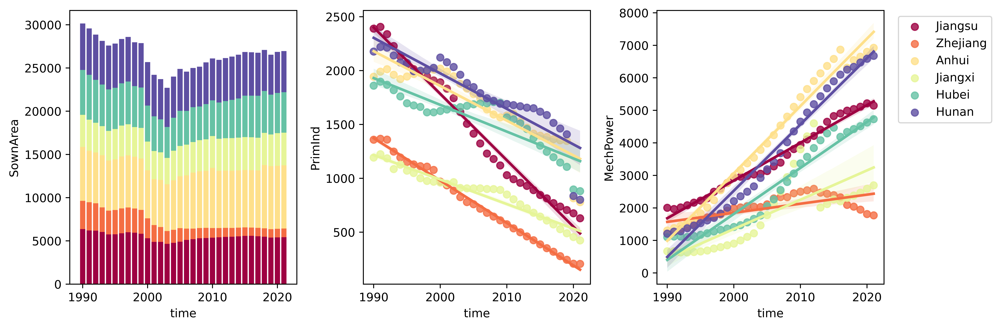

In [23]:
import matplotlib.colors as mcolors

a_fig, a_axes=plt.subplots(1, 3, figsize=(12, 4), dpi=900)
cmap=plt.get_cmap('Spectral')
# The x-axis coordinates for each bar
colors = [cmap(i) for i in np.linspace(0, 1, 6)]

prov_pcode={'CN032': 'Jiangsu',
           'CN033': 'Zhejiang',
           'CN034': 'Anhui',
           'CN036': 'Jiangxi',
           'CN042': 'Hubei',
           'CN043': 'Hunan'}

# Plotting the stacked bars
a_axes[0].bar(tdf['YEAR'][tdf['pcode'].str.contains(pcode_li[0])], tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[0])], 
        color=colors[0],
        label=pcode_li[0])
a_axes[0].bar(tdf['YEAR'][tdf['pcode'].str.contains(pcode_li[0])], tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[1])], 
        bottom=tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[0])], 
        color=colors[1],
        label=pcode_li[1])  # Stack on top of ts1
a_axes[0].bar(tdf['YEAR'][tdf['pcode'].str.contains(pcode_li[0])], tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[2])], 
        bottom=(tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[0])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[1])].reset_index())['SownArea'], 
        color=colors[2],
        label=pcode_li[2])
a_axes[0].bar(tdf['YEAR'][tdf['pcode'].str.contains(pcode_li[0])], tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[3])], 
        bottom=(tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[0])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[1])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[2])].reset_index())['SownArea'], 
        color=colors[3],
        label=pcode_li[3])
a_axes[0].bar(tdf['YEAR'][tdf['pcode'].str.contains(pcode_li[0])], tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[4])], 
        bottom=(tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[0])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[1])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[2])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[3])].reset_index())['SownArea'], 
        color=colors[4],
        label=pcode_li[4])
a_axes[0].bar(tdf['YEAR'][tdf['pcode'].str.contains(pcode_li[0])], tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[5])], 
        bottom=(tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[0])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[1])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[2])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[3])].reset_index()+
                tdf['SownArea'][tdf['pcode'].str.contains(pcode_li[4])].reset_index())['SownArea'], 
        color=colors[5],
        label=pcode_li[5])

# Add labels and legend

# Swap labels
handles, labels = a_axes[0].get_legend_handles_labels()
new_labels = [prov_pcode[label] if label in prov_pcode else label for label in labels]


for i in range(6):
    sns.regplot(x="YEAR", y="PrimInd", data=tdf[tdf['pcode'].str.contains(pcode_li[i])], ax=a_axes[1], label=list(prov_pcode.values())[i], color=colors[i], scatter_kws={'color':colors[i]}, line_kws={'color':colors[i]})

for i in range(6):
    sns.regplot(x="YEAR", y="MechPower", data=tdf[tdf['pcode'].str.contains(pcode_li[i])], ax=a_axes[2], label=list(prov_pcode.values())[i], color=colors[i], scatter_kws={'color':colors[i]}, line_kws={'color':colors[i]})

a_axes[0].set_ylabel('SownArea')
a_axes[1].set_ylabel('PrimInd')
a_axes[2].set_ylabel('MechPower')
a_axes[2].legend(loc='upper right', bbox_to_anchor=(1.5,1))

a_axes[0].set_xlabel('time')
a_axes[1].set_xlabel('time')
a_axes[2].set_xlabel('time')

a_fig.tight_layout()

In [24]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

def normalize_minmax(df):
    scaler = MinMaxScaler()
    return pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

In [25]:
column=['PrimInd', 'HHPopul', 'MechPower', 'SownArea']
tdf[column]=normalize_minmax(tdf[column])

In [26]:
# reorder
df = pd.concat([tdf, final_clims], axis=1)

df.drop('HHPopul', axis=1, inplace=True)
new_order = ['SownArea'] + [col for col in df.columns if col != 'SownArea' ]
df = df[new_order]
new_order = ['pcode'] + [col for col in df.columns if col != 'pcode' ]
df = df[new_order]
new_order = ['YEAR'] + [col for col in df.columns if col != 'YEAR' ]
df = df[new_order]
new_order = ['TGrainOut'] + [col for col in df.columns if col != 'TGrainOut' ]
df = df[new_order]

In [27]:
df.isna().sum().sum()

0

In [28]:
df['YEAR'][df['pcode'].str.contains(pcode_li[0])]

0     1990
1     1991
2     1992
3     1993
4     1994
5     1995
6     1996
7     1997
8     1998
9     1999
10    2000
11    2001
12    2002
13    2003
14    2004
15    2005
16    2006
17    2007
18    2008
19    2009
20    2010
21    2011
22    2012
23    2013
24    2014
25    2015
26    2016
27    2017
28    2018
29    2019
30    2020
31    2021
Name: YEAR, dtype: int64

# Continuous Random Forest

## Continuous RF Training

In [31]:
df.iloc[:, 1:]

,YEAR,pcode,SownArea,dt,PrimInd,MechPower,hwave1,hwave2,hwave3,hwave4,...,tas7,tas8,pr1,pr2,pr3,pr4,pr5,pr6,pr7,pr8
0,1990,CN032,0.850226,0,0.992531,0.218365,-65.744843,85.885788,-10.319810,-0.418050,...,-5645.997070,4617.920898,-763.673279,1071.130493,-6712.449707,-2982.601562,7205.224121,1890.529785,-4718.142578,1385.812256
1,1991,CN032,0.825049,1,1.000000,0.212302,-31.098438,42.943596,3.197528,-1.884718,...,-5626.110352,4603.894043,-7630.289062,-3358.195557,-4070.344482,-2530.248779,9870.209961,-3193.788818,-12100.520508,5190.309082
2,1992,CN032,0.821592,2,0.969200,0.220160,-38.755665,58.804554,-7.592219,-8.248570,...,-5626.711914,4608.385254,970.342102,1166.024048,-3224.277344,-2267.109619,5040.023438,2080.977783,-4351.060059,1345.139160
3,1993,CN032,0.797851,3,0.919252,0.230596,-42.327549,46.918655,2.050415,0.399250,...,-5624.970703,4605.199707,-1703.116699,624.333374,-4034.212646,-3400.503906,7586.743164,1318.833618,-4716.404297,2600.123047
4,1994,CN032,0.753722,4,0.875423,0.243251,-38.372200,72.373360,-9.968205,-5.727635,...,-5644.840820,4622.104004,1280.711426,73.644234,-2189.141113,-1682.395752,4462.956055,2435.306396,-2184.713135,2486.196777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,2017,CN043,0.632774,27,0.595159,0.893629,-25.168730,35.105232,-43.588455,-29.481251,...,-3309.549561,2996.689453,-4150.657715,-11136.528320,-4033.748535,-6210.698242,-857.308777,2382.656006,-3062.506836,5795.612793
188,2018,CN043,0.596474,28,0.571165,0.906934,-44.856987,40.316681,-65.935768,-40.073971,...,-3307.953857,2997.393799,-3665.613770,-1564.107178,-7111.346680,-8095.079102,5411.001465,2841.410889,-3098.125244,4708.056641
189,2019,CN043,0.575811,29,0.547007,0.928105,-38.093094,45.924347,-42.794811,-40.783558,...,-3311.943115,2995.742920,-7332.030762,-7277.600098,-3100.192627,-7040.051270,643.535461,661.900146,-8362.012695,8740.774414
190,2020,CN043,0.597550,30,0.286405,0.946715,-25.183201,39.609306,-54.871292,-37.867538,...,-3313.092041,2996.582520,1844.386108,-2596.520996,-8930.144531,-4632.403809,-1120.777832,11523.542969,-6090.112305,3924.021973


<Axes: >

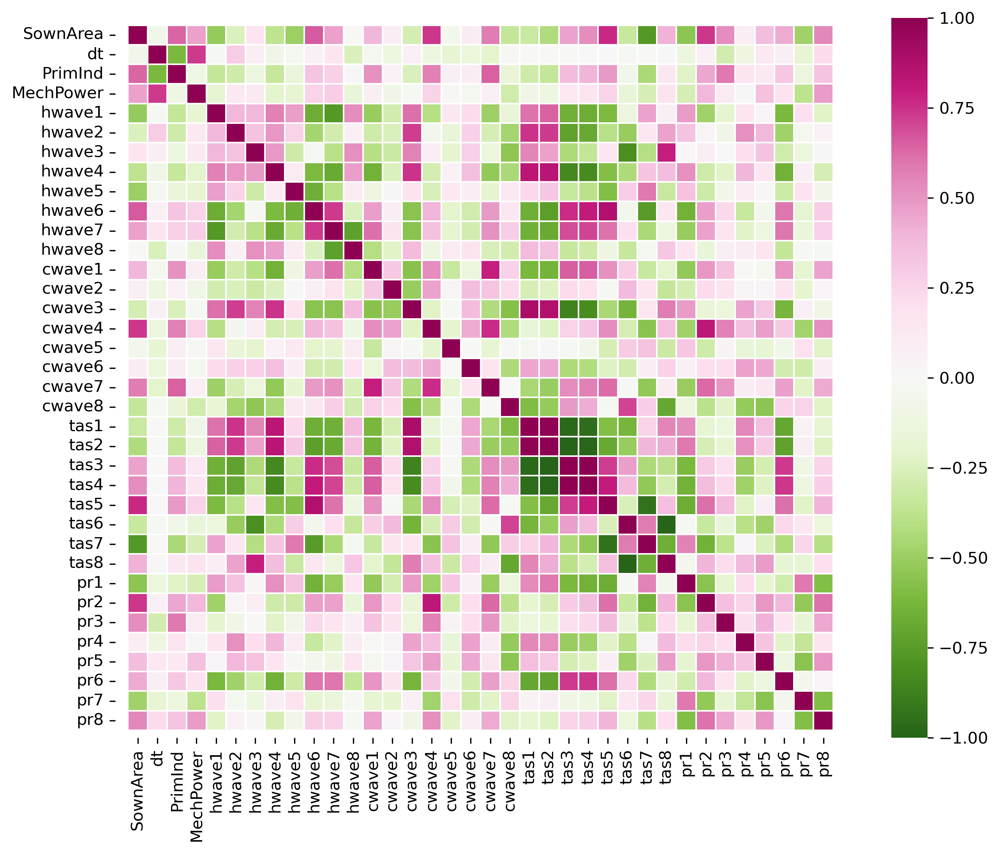

In [32]:
vfig, vax = plt.subplots(figsize=(9,7.4), dpi=300)

sns.heatmap(df.iloc[:, 1:].drop(['pcode','YEAR'],axis=1).corr(), cmap='PiYG_r', annot=False,fmt=".2f", ax=vax, linewidth=.5, vmin=-1, vmax=1, cbar_kws={'location':'right', 'shrink':1})
#vfig.suptitle('Pearson Correlation between Variables')
vax.set_xticklabels(vax.get_xticklabels(), rotation = 90)
vax.set_yticklabels(vax.get_yticklabels(), rotation = 0)
vax.axis('equal')
vfig.tight_layout()
plt.gca()

In [33]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

In [34]:
# Changed  3.22
# Added ccp_alpha for pruning
# Added split parameters

import time
start = time.time()

X = df.iloc[:, 1:]
y = df[['TGrainOut', 'YEAR', 'pcode']]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=881)

n_estimators_range = np.arange(200, 751, 25)
max_depth_range = [None, 10, 20, 30, 40, 50]
min_samples_split_range = [2, 4, 6, 8, 10]
min_samples_leaf_range = [1, 2, 4]
ccp_alpha_range = [0.0, 0.001, 0.01, 0.1, 0.2, 0.3]

best_score = -np.inf
best_params = {}

nli=[]
dli=[]
sli=[]
lli=[]
pruneli=[]
scoreli=[]

pois=[]

from sklearn.metrics import mean_poisson_deviance
# Iterate over the range and perform k-fold cross-validation
for n in n_estimators_range:
    for d in max_depth_range:
        for s in min_samples_split_range:
            for l in min_samples_leaf_range:
                for prune in ccp_alpha_range:
                    # Create and fit the model
                    model = RandomForestRegressor(n_estimators=n, max_depth=d, 
                                                  min_samples_split=s, min_samples_leaf=l, 
                                                  ccp_alpha=prune, n_jobs=-1, random_state=4459)
                    scores = cross_val_score(model, X_train.iloc[:, 2:], y_train['TGrainOut'].to_numpy(), cv=10, n_jobs=4, scoring='neg_mean_absolute_percentage_error')
                    mean_score = np.mean(scores)
                
                    nli.append(n)
                    dli.append(d)
                    sli.append(s)
                    lli.append(l)
                    pruneli.append(prune)
                    scoreli.append(mean_score)
                
                    if mean_score > best_score:
                        best_score = mean_score
                        best_params = {'n_estimators': n, 'max_depth': d, 
                                       'min_samples_split': s, 'min_samples_leaf': l, 
                                       'ccp_alpha': prune}
                
                    model.fit(X_train.iloc[:, 2:], y_train['TGrainOut'].to_numpy())
                    y_pred = model.predict(X_test.iloc[:, 2:])
                    pois.append(mean_poisson_deviance(y_test['TGrainOut'], y_pred))
                        
gridsearchresult=pd.DataFrame( data={'n_estimators': nli, 'max_depth': dli, 
                                   'min_samples_split': sli, 'min_samples_leaf': lli, 
                                   'ccp_alpha': pruneli})
print("Best score:", best_score)
print("Best parameters:", best_params)

end= time.time()

Best score: -0.0557747882266036
Best parameters: {'n_estimators': 500, 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 1, 'ccp_alpha': 0.3}


In [35]:
start-end

-50416.2123067379

In [235]:
def Convert(lst):
	return [ -i for i in lst ]

gridsearchresult['mape_score']=Convert(scoreli)
gridsearchresult['pdev']=pois
gs=gridsearchresult[gridsearchresult['ccp_alpha']==0.0].copy()
gs.fillna(0, inplace=True)
gs=gs[gs['min_samples_leaf']==1]
gs=gs[gs['min_samples_split']==2]
gs=gs[gs['n_estimators']>200]
gs=gs[gs['max_depth']<50]

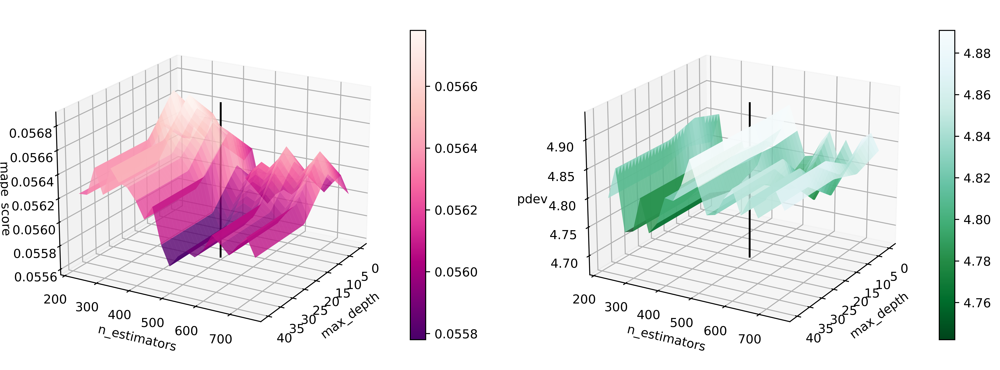

In [236]:
from scipy.interpolate import griddata
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm

# Create grid values for interpolation
xi = np.linspace(gs['max_depth'].min(), gs['max_depth'].max(), 66)
yi = np.linspace(gs['n_estimators'].min(), gs['n_estimators'].max(), 22)
xi, yi = np.meshgrid(xi, yi)

# Interpolating for mape_score
zi_mape = griddata((gs['max_depth'], gs['n_estimators']), gs['mape_score'], (xi, yi), method='linear')

# Interpolating for pdev
zi_pdev = griddata((gs['max_depth'], gs['n_estimators']), gs['pdev'], (xi, yi), method='linear')

fig = plt.figure(figsize=(14, 9), dpi=800)

ax1 = fig.add_subplot(121, projection='3d')
#sc1 = ax1.scatter(gs['max_depth'], gs['n_estimators'], gs['mape_score'], c=gs['mape_score'], cmap='RdPu_r')
ax1.plot_surface(xi, yi, zi_mape, cmap='RdPu_r', alpha=0.8)


ax1.set_xlabel('max_depth')
ax1.set_ylabel('n_estimators')
ax1.set_zlabel('mape_score')
#ax1.set_title('max_depth, n_estimators vs mape_score with Fitted Plane')

m = cm.ScalarMappable(cmap='RdPu_r')
m.set_array(zi_mape)
plt.colorbar(m, ax=ax1, shrink=0.5, aspect=20)

# 3D plot for pdev with fitted plane and color-coded scatter
ax2 = fig.add_subplot(122, projection='3d')
#sc2 = ax2.scatter(gs['max_depth'], gs['n_estimators'], gs['pdev'], c=gs['pdev'], cmap='BuGn_r')
ax2.plot_surface(xi, yi, zi_pdev, cmap='BuGn_r', alpha=0.8)


ax2.set_xlabel('max_depth')
ax2.set_ylabel('n_estimators')
ax2.set_zlabel('pdev')
#ax2.set_title('max_depth, n_estimators vs pdev with Fitted Plane')

m = cm.ScalarMappable(cmap='BuGn_r')
m.set_array(zi_pdev)
plt.colorbar(m, ax=ax2, shrink=0.5, aspect=20)

# Range for z-axis (from min to max of mape_score)
z_line = [gs['mape_score'].min()-0.0002, gs['mape_score'].max()+0.0001]

# Adding the vertical line to ax1
ax1.plot3D([20, 20], [500, 500], z_line, ls='-', color='black')

z_line = [gs['pdev'].min()-.07, gs['pdev'].max()+0.05]

# Adding the vertical line to ax1
ax2.plot3D([20, 20], [500, 500], z_line, ls='-', color='black')

ax1.view_init(elev=20, azim=30)
ax2.view_init(elev=20, azim=30)

#fig.tight_layout()
plt.show()

In [66]:
X

array([[ 0., 10., 20., ..., 30., 40., 50.],
       [ 0., 10., 20., ..., 30., 40., 50.],
       [ 0., 10., 20., ..., 30., 40., 50.],
       ...,
       [ 0., 10., 20., ..., 30., 40., 50.],
       [ 0., 10., 20., ..., 30., 40., 50.],
       [ 0., 10., 20., ..., 30., 40., 50.]])

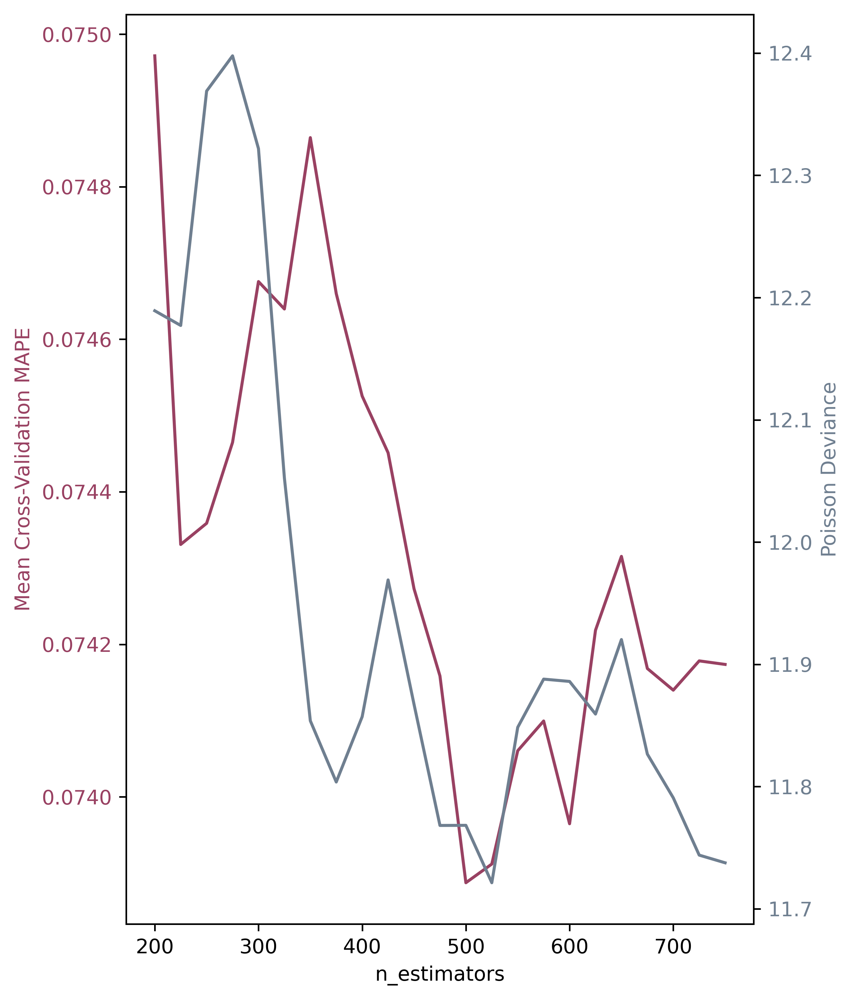

In [1220]:
mumape=pd.DataFrame(index=nli)
mumape['MAPE']=sli
mumape['Poisson']=pois

fig, ax1 = plt.subplots(figsize=(6,7), dpi=450)

color = '#994162'
ax1.set_xlabel('n_estimators')
ax1.set_ylabel('Mean Cross-Validation MAPE', color=color)
ax1.plot(mumape.index, -mumape['MAPE'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = '#6f7f90'
ax2.set_ylabel('Poisson Deviance', color=color)  # we already handled the x-label with ax1
ax2.plot(mumape.index, mumape['Poisson'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [ ]:
from sklearn import metrics

y_true = [...] # Your real values / test labelsy_pred = [...] # The predictions from your ML / RF model

print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_true, y_pred))print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_true, y_pred))print('Root Mean Squared Error (RMSE):', metrics.mean_squared_error(y_true, y_pred, squared=False))print('Mean Absolute Percentage Error (MAPE):', metrics.mean_absolute_percentage_error(y_true, y_pred))print('Explained Variance Score:', metrics.explained_variance_score(y_true, y_pred))print('Max Error:', metrics.max_error(y_true, y_pred))print('Mean Squared Log Error:', metrics.mean_squared_log_error(y_true, y_pred))print('Median Absolute Error:', metrics.median_absolute_error(y_true, y_pred))print('R^2:', metrics.r2_score(y_true, y_pred))print('Mean Poisson Deviance:', metrics.mean_poisson_deviance(y_true, y_pred))print('Mean Gamma Deviance:', metrics.mean_gamma_deviance(y_true, y_pred))

In [237]:
import sklearn.metrics as metrics

X = df.iloc[:, 1:]
y = df[['TGrainOut', 'YEAR', 'pcode']]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=881)

# Creating the Random Forest Regressor
rf = RandomForestRegressor(n_estimators=500, 
                           #max_depth=20, 
                                                  min_samples_split=2, min_samples_leaf=1, 
                                                   n_jobs=-1, random_state=4459)

# Training the model
rf.fit(X_train.iloc[:, 2:], y_train['TGrainOut'].to_numpy())

# Making predictions
y_pred = rf.predict(X_test.iloc[:, 2:])

# Evaluating the model
mse = metrics.mean_squared_error(y_test['TGrainOut'], y_pred)
gdev = metrics.mean_gamma_deviance(y_test['TGrainOut'], y_pred)
pdev = metrics.mean_poisson_deviance(y_test['TGrainOut'], y_pred)
ev = metrics.explained_variance_score(y_test['TGrainOut'], y_pred)


print('MAPE:', (metrics.mean_absolute_percentage_error(y_test['TGrainOut'], y_pred)))
print("Explained Var:", ev)
print('Mean Poisson Deviance:', metrics.mean_poisson_deviance(y_test['TGrainOut'], y_pred))
print('Mean Gamma Deviance:', metrics.mean_gamma_deviance(y_test['TGrainOut'], y_pred))

MAPE: 0.05984098230268762
Explained Var: 0.9437581358166037
Mean Poisson Deviance: 11.768339290532753
Mean Gamma Deviance: 0.005416559177233669


### Analysis

In [238]:
def combine_feature_importances(importances, feature_names, prefix):
    
    # Dictionary to hold new feature importances
    new_importances = {}
    prefix_sum = 0

    # Iterate over each feature
    for imp, name in zip(importances, feature_names):
        if name.startswith(prefix):
            # Sum the importances for features with the specified prefix
            prefix_sum += imp
        else:
            # Keep the other importances as is
            new_importances[name] = imp

    # Combine the summed importance with the name <prefix>
    new_importances[prefix] = prefix_sum

    return new_importances

In [239]:
temp=combine_feature_importances(rf.feature_importances_,rf.feature_names_in_, 'tas')
temp=combine_feature_importances(temp.values(),temp.keys(), 'pr')
temp=combine_feature_importances(temp.values(),temp.keys(), 'hwave')
final=combine_feature_importances(temp.values(),temp.keys(), 'cwave')

In [240]:
final

{'SownArea': 0.6335587002574117,
 'dt': 0.021866521378716034,
 'PrimInd': 0.021092123206683966,
 'MechPower': 0.053997562718936506,
 'tas': 0.1234991395903141,
 'pr': 0.02023340733204371,
 'hwave': 0.05008379569045473,
 'cwave': 0.07566874982543942}

In [168]:
sizes={}
sizes['SownArea']=final['SownArea']
sizes['Other']=sum(list(final.values())[1:])
sizes

{'SownArea': 0.7767894714568412, 'Other': 0.2232105285431591}

## Plotting

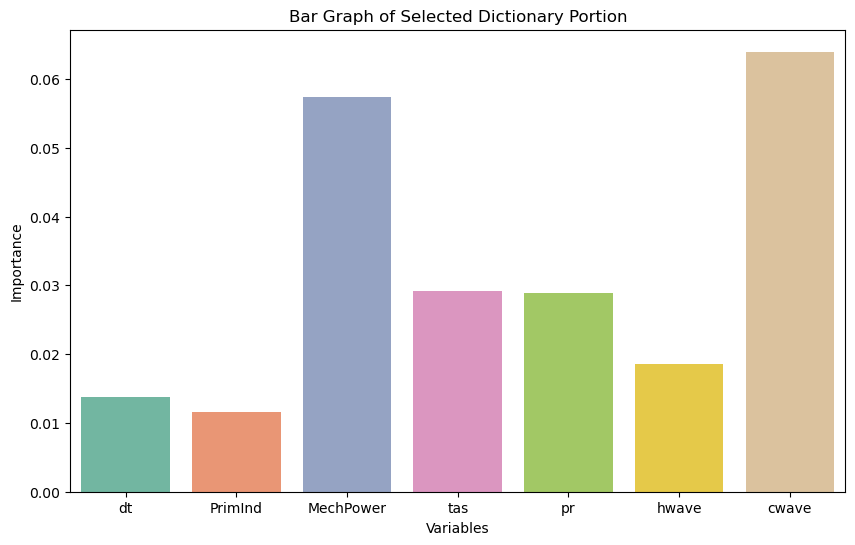

In [169]:
# Convert the portion to a DataFrame
data_df = pd.DataFrame(final,index=[1])
data_df.drop(['SownArea'], axis=1, inplace=True)

# Create the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=data_df, palette='Set2')

# Customize the plot
plt.title('Bar Graph of Selected Dictionary Portion')
plt.xlabel('Variables')
plt.ylabel('Importance')

# Show the plot
plt.show()

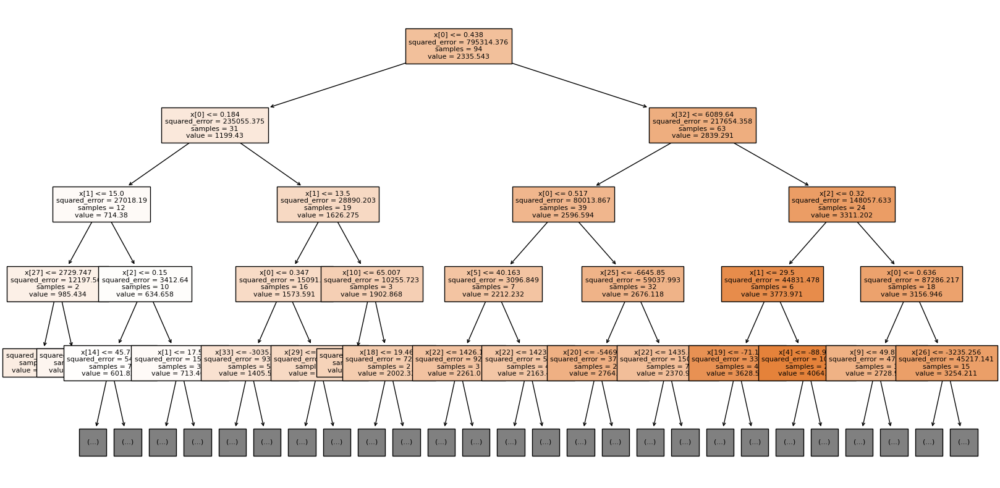

In [170]:
from sklearn.tree import plot_tree

# Selecting a single tree from the forest
single_tree = rf.estimators_[22]

plt.figure(figsize=(20,10))
plot_tree(single_tree, 
          filled=True, 
          max_depth=4,  # limiting depth for clarity
          fontsize=8)
plt.show()

In [171]:
y['pred'] = rf.predict(X.iloc[:, 2:])

In [172]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

In [173]:
Ctr='#777777'
Cte='#aaaaaa'
Cln_light='cadetblue'
cmap=['#2f9147','#2f9158','#2f9170','#2f9989','#2f8191','#2f6491']
plcolor='dimgrey'

#plt.style.use()

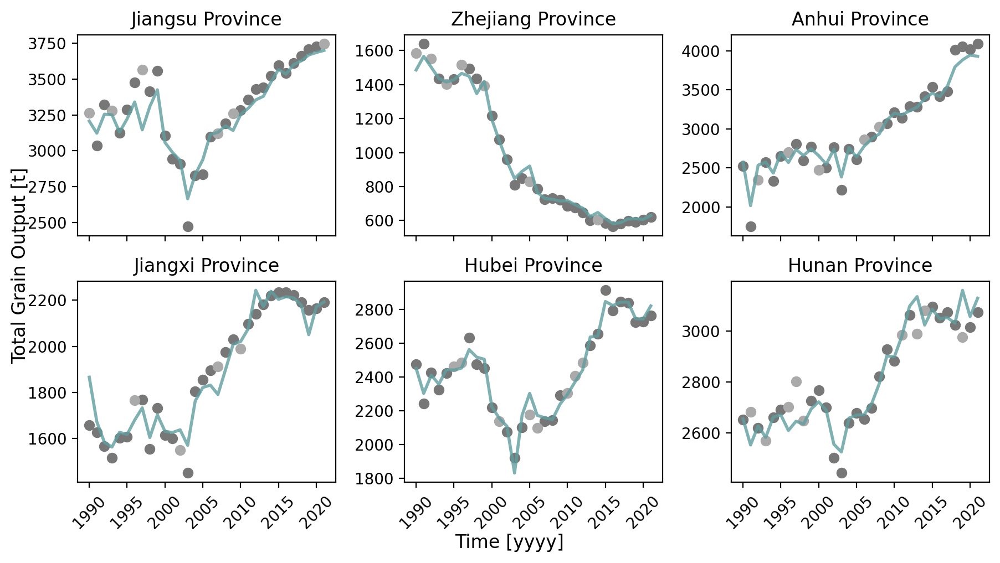

In [174]:
r_f, r_ax = plt.subplots(2,3, figsize=(9, 5), dpi=200, sharex=True)
#r_f.suptitle('Expected and Observed per-Hectare Grain Yield by Province', fontsize=14)
r_f.text(0.5,0, 'Time [yyyy]', ha='center', fontsize=12)
r_f.text(0,0.51, 'Total Grain Output [t]', va='center', rotation='vertical', fontsize=12)

prov_pcode={'CN032': 'Jiangsu',
           'CN033': 'Zhejiang',
           'CN034': 'Anhui',
           'CN036': 'Jiangxi',
           'CN042': 'Hubei',
           'CN043': 'Hunan'}

for i in range(len(pcode_li)):
    filtered_X_train = X_train[X_train['pcode'].str.contains(pcode_li[i])]
    filtered_y_train = y_train[y_train['pcode'].str.contains(pcode_li[i])]
    filtered_X_test = X_test[X_test['pcode'].str.contains(pcode_li[i])]
    filtered_y_test = y_test[y_test['pcode'].str.contains(pcode_li[i])]
    
    filtered_pred = y[y['pcode'].str.contains(pcode_li[i])]
    
    r_ax[int(i/3), int(i%3)].scatter(filtered_X_train['dt']+1990,filtered_y_train['TGrainOut'],c=Ctr)
    r_ax[int(i/3), int(i%3)].scatter(filtered_X_test['dt']+1990,filtered_y_test['TGrainOut'],c=Cte)
    r_ax[int(i/3), int(i%3)].plot(filtered_pred['YEAR'],filtered_pred['pred'], alpha=0.8, c=Cln_light, linewidth=2)
    
    r_ax[int(i/3), int(i%3)].set_title(f'{prov_pcode[pcode_li[i]]} Province')
    r_ax[int(i/3), int(i%3)].set_xticks(np.arange(1990,2025, 5))
    r_ax[int(i/3), int(i%3)].set_xticklabels(r_ax[int(i/3), int(i%3)].get_xticks(), rotation = 45)
    
r_f.tight_layout()

# Benchmark Model

In [119]:
# Temperature

origtemp=xr.open_dataset('Observed_data/tas/air.mon.mean.nc')
temp_mu=origtemp.groupby("time.year").mean("time")

temp_mu.rio.write_crs('EPSG:4326', inplace=True)

# Precipitation

origprecip=xr.open_mfdataset('Observed_data/precip/precip.*.nc')
precip_mu=origprecip.groupby("time.year").sum("time")

precip_mu.rio.write_crs('EPSG:4326', inplace=True)

# Heatwave

hw=xr.open_dataset('waves/observed_cpc_heatwave.nc')
hwave=hw.transpose('lat','lon','time').where(hw['heatwave_frequency'] >= 0)

hwave.rio.set_spatial_dims('lon', 'lat')
hwave.rio.write_crs('EPSG:4326', inplace=True)

# Coldwave

cw=xr.open_dataset('waves/observed_cpc_coldwave.nc')  
cwave=cw.transpose('lat','lon','time').where(cw['coldwave_frequency'] >= 0)

cwave.rio.set_spatial_dims('lon', 'lat')
cwave.rio.write_crs('EPSG:4326', inplace=True)

<xarray.Dataset>
Dimensions:             (lat: 360, lon: 720, time: 43)
Coordinates:
  * lat                 (lat) float32 89.75 89.25 88.75 ... -88.75 -89.25 -89.75
  * lon                 (lon) float32 0.25 0.75 1.25 1.75 ... 358.8 359.2 359.8
  * time                (time) int64 1980 1981 1982 1983 ... 2019 2020 2021 2022
    spatial_ref         int32 0
Data variables:
    coldwave_frequency  (lat, lon, time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0

In [113]:
pcode_li

['CN032', 'CN033', 'CN034', 'CN036', 'CN042', 'CN043']

In [121]:
import geopandas as gpd
import rioxarray

# Read SHP as GDF for clipping

gdf = gpd.read_file("SHP/chn_adm_ocha_2020_shp",layer=2)

temp=[]
precip=[]
heat=[]
cold=[]

for pcode in pcode_li:

    filtered=gdf[gdf['ADM1_PCODE']==pcode]
    
    JStemp=temp_mu.rio.clip(filtered.geometry.values, filtered.geometry.crs, drop=True)
    JSprecip=precip_mu.rio.clip(filtered.geometry.values, filtered.geometry.crs, drop=True)
    JShwave=hwave.rio.clip(filtered.geometry.values, filtered.geometry.crs, drop=True)
    JScwave=cwave.rio.clip(filtered.geometry.values, filtered.geometry.crs, drop=True)
    
    for yr in JStemp['air'][42:74,:].to_numpy():
        s=np.nansum(yr)
        temp.append(s/np.count_nonzero(~np.isnan(yr))-273)  
        
    
    for yr in JSprecip['precip'][:32,:].to_numpy():
        s=np.nansum(yr)
        precip.append(s/np.count_nonzero(~np.isnan(yr)))
    
    
    for i in range(10,42):
            f=JShwave['heatwave_frequency'][:,:,i].to_numpy()
            s=np.nansum(f)
            heat.append(s/np.count_nonzero(~np.isnan(f)))
            
    for i in range(10,42):
            f=JScwave['coldwave_frequency'][:,:,i].to_numpy()
            s=np.nansum(f)
            cold.append(s/np.count_nonzero(~np.isnan(f)))

final_clims=pd.DataFrame(data={'tas':temp,'pr':precip,'hwave':heat, 'cwave':cold})

In [122]:
# concat econ vars
tdf=pd.read_csv(f"Observed_data/province/data.{pcode_li[0]}.csv", na_values=['NONE'])
tdf['pcode']=pcode_li[0]
for i in range(1, len(pcode_li)):
    df=pd.read_csv(f"Observed_data/province/data.{pcode_li[i]}.csv", na_values=['NONE'])
    df['pcode']=pcode_li[i]
    tdf=pd.concat([tdf, df], ignore_index=True)

In [123]:
# reorder
df = pd.concat([tdf['dt'], tdf['YEAR'],tdf.drop(['YEAR','dt','HHPopul','pcode'], axis=1).transform('log'), final_clims, tdf['pcode']], axis=1)

new_order = ['SownArea'] + [col for col in df.columns if col != 'SownArea' ]
df = df[new_order]
new_order = ['pcode'] + [col for col in df.columns if col != 'pcode' ]
df = df[new_order]
new_order = ['YEAR'] + [col for col in df.columns if col != 'YEAR' ]
df = df[new_order]
new_order = ['TGrainOut'] + [col for col in df.columns if col != 'TGrainOut' ]
df = df[new_order]

In [138]:
X = df.iloc[:, 3:].to_numpy()
y = df[['TGrainOut']].to_numpy()

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.8, random_state=756)

from sklearn.linear_model import LinearRegression
ols = LinearRegression()
ols.fit(X_train, y_train)

# Predicting the Test set results
y_pred = ols.predict(X_test)
yt_pred = ols.predict(X_train)
yall_pred = ols.predict(X)

In [139]:
#FGLS

residual = (y_train - yt_pred)

n = len(residual)
covariance_matrix = np.dot(residual.reshape(-1, 1), residual.reshape(1, -1)) / n

# Using the absolute values of the residuals to construct the weights
regularization_strength = 1e-6
covariance_matrix += np.eye(covariance_matrix.shape[0]) * regularization_strength
weights = np.linalg.inv(covariance_matrix)
model_fgls = sm.GLS(y_train, X_train, sigma=covariance_matrix).fit()
print(model_fgls.summary())

                                 GLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   1.000
Model:                            GLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          2.424e+06
Date:                Tue, 26 Mar 2024   Prob (F-statistic):                        0.00
Time:                        00:45:12   Log-Likelihood:                          369.33
No. Observations:                 153   AIC:                                     -722.7
Df Residuals:                     145   BIC:                                     -698.4
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [140]:
y_pred=np.exp(model_fgls.predict(X_test))

import sklearn.metrics as metrics

print('MAPE:', (metrics.mean_absolute_percentage_error(np.exp(y_test), y_pred)))
print("Explained Var:", metrics.explained_variance_score(np.exp(y_test), y_pred))
print('Mean Poisson Deviance:', metrics.mean_poisson_deviance(np.exp(y_test), y_pred))
print('Mean Gamma Deviance:', metrics.mean_gamma_deviance(np.exp(y_test), y_pred))

MAPE: 0.07367886779513197
Explained Var: 0.8721267266783704
Mean Poisson Deviance: 29.600019924061254
Mean Gamma Deviance: 0.011067849378984435


## Constant Sown Area Dummy

In [175]:
# concat econ vars
tdf=pd.read_csv(f"Observed_data/province/data.{pcode_li[0]}.csv", na_values=['NONE'])
tdf['SownArea']=tdf['SownArea'].iloc[-1]
tdf['pcode']=pcode_li[0]
for i in range(1, len(pcode_li)):
    df=pd.read_csv(f"Observed_data/province/data.{pcode_li[i]}.csv", na_values=['NONE'])
    df['SownArea']=df['SownArea'].iloc[-1]
    df['pcode']=pcode_li[i]
    tdf=pd.concat([tdf, df], ignore_index=True)

from sklearn.preprocessing import MinMaxScaler, StandardScaler

def normalize_minmax(df):
    scaler = MinMaxScaler()
    return pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

column=['PrimInd', 'HHPopul', 'MechPower', 'SownArea']
tdf[column]=normalize_minmax(tdf[column])

# reorder
df = pd.concat([tdf, final_clims], axis=1)

df.drop('HHPopul', axis=1, inplace=True)
new_order = ['SownArea'] + [col for col in df.columns if col != 'SownArea' ]
df = df[new_order]
new_order = ['pcode'] + [col for col in df.columns if col != 'pcode' ]
df = df[new_order]
new_order = ['YEAR'] + [col for col in df.columns if col != 'YEAR' ]
df = df[new_order]
new_order = ['TGrainOut'] + [col for col in df.columns if col != 'TGrainOut' ]
df = df[new_order]

X = df.iloc[:, 1:]
y = df[['TGrainOut', 'YEAR', 'pcode']]

In [176]:
X

,YEAR,pcode,SownArea,dt,PrimInd,MechPower,hwave1,hwave2,hwave3,hwave4,...,tas7,tas8,pr1,pr2,pr3,pr4,pr5,pr6,pr7,pr8
0,1990,CN032,0.701396,0,0.992531,0.218365,-65.744843,85.885788,-10.319810,-0.418050,...,-5645.997070,4617.920898,-763.673279,1071.130493,-6712.449707,-2982.601562,7205.224121,1890.529785,-4718.142578,1385.812256
1,1991,CN032,0.701396,1,1.000000,0.212302,-31.098438,42.943596,3.197528,-1.884718,...,-5626.110352,4603.894043,-7630.289062,-3358.195557,-4070.344482,-2530.248779,9870.209961,-3193.788818,-12100.520508,5190.309082
2,1992,CN032,0.701396,2,0.969200,0.220160,-38.755665,58.804554,-7.592219,-8.248570,...,-5626.711914,4608.385254,970.342102,1166.024048,-3224.277344,-2267.109619,5040.023438,2080.977783,-4351.060059,1345.139160
3,1993,CN032,0.701396,3,0.919252,0.230596,-42.327549,46.918655,2.050415,0.399250,...,-5624.970703,4605.199707,-1703.116699,624.333374,-4034.212646,-3400.503906,7586.743164,1318.833618,-4716.404297,2600.123047
4,1994,CN032,0.701396,4,0.875423,0.243251,-38.372200,72.373360,-9.968205,-5.727635,...,-5644.840820,4622.104004,1280.711426,73.644234,-2189.141113,-1682.395752,4462.956055,2435.306396,-2184.713135,2486.196777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,2017,CN043,0.595228,27,0.595159,0.893629,-25.168730,35.105232,-43.588455,-29.481251,...,-3309.549561,2996.689453,-4150.657715,-11136.528320,-4033.748535,-6210.698242,-857.308777,2382.656006,-3062.506836,5795.612793
188,2018,CN043,0.595228,28,0.571165,0.906934,-44.856987,40.316681,-65.935768,-40.073971,...,-3307.953857,2997.393799,-3665.613770,-1564.107178,-7111.346680,-8095.079102,5411.001465,2841.410889,-3098.125244,4708.056641
189,2019,CN043,0.595228,29,0.547007,0.928105,-38.093094,45.924347,-42.794811,-40.783558,...,-3311.943115,2995.742920,-7332.030762,-7277.600098,-3100.192627,-7040.051270,643.535461,661.900146,-8362.012695,8740.774414
190,2020,CN043,0.595228,30,0.286405,0.946715,-25.183201,39.609306,-54.871292,-37.867538,...,-3313.092041,2996.582520,1844.386108,-2596.520996,-8930.144531,-4632.403809,-1120.777832,11523.542969,-6090.112305,3924.021973


In [177]:
y['pred'] = rf.predict(X.iloc[:, 2:])

prov_pcode={'CN032': 'Jiangsu',
           'CN033': 'Zhejiang',
           'CN034': 'Anhui',
           'CN036': 'Jiangxi',
           'CN042': 'Hubei',
           'CN043': 'Hunan'}
    

i=0
filtered_pred = y[y['pcode'].str.contains(pcode_li[i])].set_index('YEAR').drop('pcode', axis=1)

for i in range(1, len(pcode_li)):
    filtered_pred['TGrainOut'] = filtered_pred[['TGrainOut']]+y[y['pcode'].str.contains(pcode_li[i])][['YEAR','TGrainOut']].set_index('YEAR')
    filtered_pred['pred'] = filtered_pred[['pred']]+y[y['pcode'].str.contains(pcode_li[i])][['YEAR','pred']].set_index('YEAR')

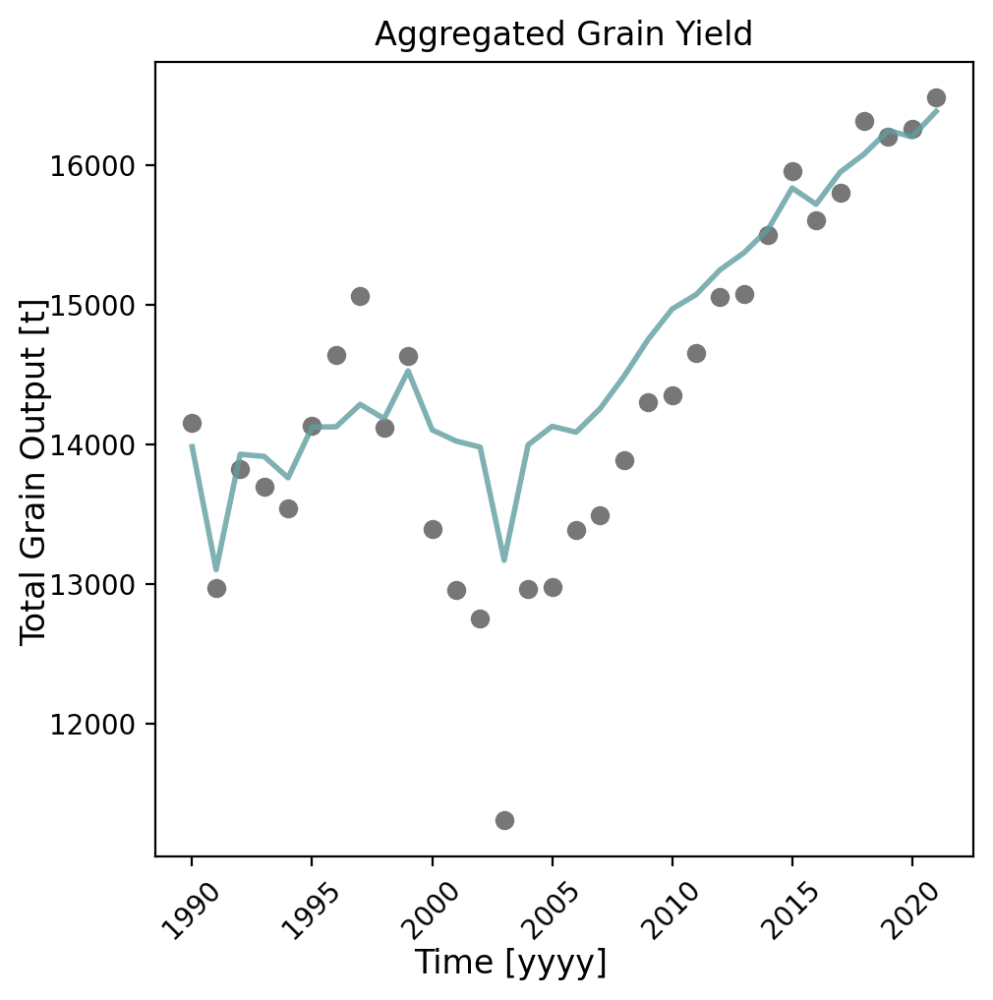

In [178]:
ready=filtered_pred.reset_index().rename(columns={'index': 'YEAR'})

r_f, r_ax = plt.subplots(1,1, figsize=(5, 5), dpi=200)
#r_f.suptitle('Expected and Observed per-Hectare Grain Yield by Province', fontsize=14)
r_f.text(0.5,0, 'Time [yyyy]', ha='center', fontsize=12)
r_f.text(0,0.51, 'Total Grain Output [t]', va='center', rotation='vertical', fontsize=12)

r_ax.scatter(ready['YEAR'],ready['TGrainOut'],c=Ctr)
r_ax.plot(ready['YEAR'],ready['pred'], alpha=0.8, c=Cln_light, linewidth=2)
    
r_ax.set_title(f'Aggregated Grain Yield')
r_ax.set_xticks(np.arange(1990,2025, 5))
r_ax.set_xticks(np.arange(1990,2025, 5))
r_ax.set_xticklabels(r_ax.get_xticks(), rotation = 45)
    
r_f.tight_layout()

# Sensitivity Tests

## Testing Sets Prep

### Temporal Testers

- Uniform datasets per year
- Econ data controlled at 2021 level
- Linear increase in ETE (0.2 per year)
- Test on increase of heatwave/coldwave occurence vs. constant heatwave occurence vs. no heatwave occurence

#### Generate Dummy Climate Data

In [179]:
batch_size = 50

In [180]:
# ETE Increase
mean_start = 1.0
std_dev = 1.0

incr_batch = torch.empty(batch_size, 1, 50, 50)
for i in range(batch_size):
    incr_batch[i] = torch.normal(mean=mean_start+float(i)/5, std=std_dev, size=(1, 50, 50))
    
# ETE Decrease
n_start = float(batch_size)/5+1.0
decr_batch = torch.empty(batch_size, 1, 50, 50)
for i in range(batch_size):
    decr_batch[i] = torch.normal(mean=n_start-float(i)/5, std=std_dev, size=(1, 50, 50))

# ETE Constant
c_batch = torch.empty(batch_size, 1, 50, 50)
for i in range(batch_size):
    c_batch[i] = torch.normal(mean=mean_start, std=std_dev, size=(1, 50, 50))

In [181]:
# tas and pr random normally distributed
batch_size = 50
norm_4dbatch = torch.empty(batch_size, 1, 12, 52, 52).normal_()

# tas and pr uniform
unif_tasbatch = torch.empty(batch_size, 1, 12, 52, 52)
for i in range(batch_size):
    unif_tasbatch[i] = torch.full((1, 12, 52, 52), float(298.0))

unif_prbatch = torch.empty(batch_size, 1, 12, 52, 52)
for i in range(batch_size):
    unif_prbatch[i] = torch.full((1, 12, 52, 52), float(100))

dims = (1, 12, 52, 52)  
incr_tasbatch = torch.zeros((batch_size,) + dims)
decr_prbatch = torch.zeros((batch_size,) + dims)
for i in range(batch_size):
    incr_tasbatch[i] = torch.full(dims, i+310)
    decr_prbatch[i] = torch.full(dims, 100-i/2)

In [188]:
heat_S_enc=fit(incr_batch, heat_aencoder, varname='hwave')
cold_S_enc=fit(c_batch, cold_aencoder, varname='cwave')
pr_S_enc=fit(unif_prbatch, pr_mencoder, varname='pr')
tas_S_enc=fit(unif_tasbatch, tas_mencoder, varname='tas')

#### Finalize

In [189]:
import random

econstatus=pd.DataFrame(index=range(batch_size))

random_dt= np.linspace(30, 79, num=50)
random_PrimInd = np.random.uniform(0.2, 1)
random_MechPower = np.random.uniform(0.2, 1)
SownArea=1000

print(f"Using dt={random_dt}, PrimInd={random_PrimInd}, MechPower={random_MechPower}")

econstatus['SownArea']=SownArea
econstatus['dt']=40
econstatus['PrimInd']=random_PrimInd
econstatus['MechPower']=random_MechPower

Using dt=[30. 31. 32. 33. 34. 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47.
 48. 49. 50. 51. 52. 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65.
 66. 67. 68. 69. 70. 71. 72. 73. 74. 75. 76. 77. 78. 79.], PrimInd=0.7338855557875079, MechPower=0.7140850819885947


In [190]:
Stdf=pd.concat([econstatus, heat_S_enc, cold_S_enc,tas_S_enc, pr_S_enc], axis=1)

In [191]:
Spred=rf.predict(Stdf)

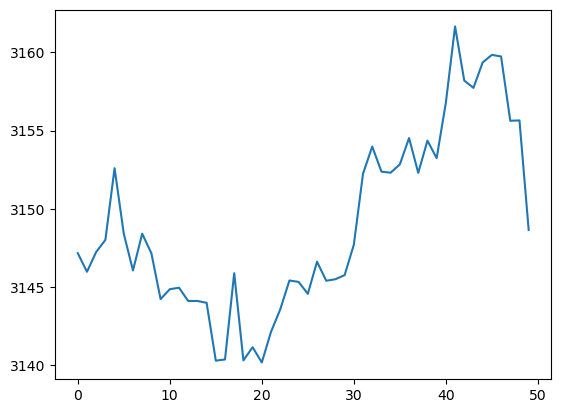

In [192]:
plt.plot(Spred)

## Run Tests

In [51]:
# Test run at 

# Climate on Future Yield

- Classes
```
LoaderDataset #A data wrapper for dataloaders
```
    - Constructed Instances
    ```
    heat_aencoder #Trained heatwave autoencoder
    cold_aencoder #Trained coldwave autoencoder
    tas_aencoder #Trained tas autoencoder
    pr_aencoder #Trained precipitation autoencoder
    rf #Trained grain yield random forest
    ```
- Methods

    - resample(data, varname, new_x=50, new_y=50, to_numpy=True)
        - data: xr.DataArray, varname: str data var name; return np.ndarray of shape [t, 50, 50]
    
    - group_resample(data, tvarname, datavarname, new_x=52, new_y=52, to_numpy=True)
        - data: xr.DataArray, tvarname: str time var name, datavarname: str data var name; return np.ndarray of shape [yr, 12, 50, 50]
    
    - deletefrom(df, nfront, nback)
        - definition:
    ```
    chunks = [df.iloc[i+nfront : i+(nfront+33-nback)] for i in range(0, len(df), nfront+33)]
    return pd.concat(chunks).reset_index(drop=True)
    ````

- Variable units
```
Heatwave: freq per year
Coldwave: freq per year
tas: DegC
pr: mm
```

## Extrapolated df

In [94]:
import os

In [95]:
from sklearn.linear_model import LinearRegression
num_extrapolations = 79

pcode='CN032'
df=pd.read_csv(f"Observed_data/province/data.{pcode}.csv", na_values=['NONE'])

column=['PrimInd', 'HHPopul', 'MechPower', 'SownArea']
df[column]=normalize_minmax(df[column])

extrapolated_values = pd.DataFrame(index=range(len(df), len(df) + num_extrapolations))

# Linearly extrapolate each column
for column in df.columns:
    # Prepare the data for linear regression
    X = np.arange(len(df)).reshape(-1, 1)  # Existing indices
    y = df[column].values

    # Create and fit the model
    model = LinearRegression()
    model.fit(X, y)

    # Predict future values
    new_indices = np.arange(len(df), len(df) + num_extrapolations).reshape(-1, 1)
    predictions = model.predict(new_indices)

    # Store predictions in the DataFrame
    extrapolated_values[column] = predictions

# Append the extrapolated values to the original DataFrame
df_extrapolated = pd.concat([df, extrapolated_values]).reset_index(drop=True)

In [96]:
df_extrapolated[-86:]

,YEAR,dt,PrimInd,HHPopul,MechPower,SownArea,TGrainOut
25,2015.0,25.0,0.121622,0.890544,0.880137,0.535981,3594.710000
26,2016.0,26.0,0.104252,0.928714,0.905093,0.542285,3542.440000
27,2017.0,27.0,0.078948,0.952890,0.931218,0.509430,3610.800000
28,2018.0,28.0,0.060941,0.965942,0.946876,0.479270,3660.280000
29,2019.0,29.0,0.043001,0.979114,0.968327,0.423827,3706.200000
...,...,...,...,...,...,...,...
106,2096.0,106.0,-2.682516,3.633569,3.698102,-0.566953,4711.833376
107,2097.0,107.0,-2.717229,3.667998,3.733816,-0.578647,4727.394287
108,2098.0,108.0,-2.751943,3.702427,3.769530,-0.590340,4742.955198
109,2099.0,109.0,-2.786657,3.736856,3.805244,-0.602034,4758.516109


## Class Wrappers

In [241]:
class ModelData:
    def __init__(self, model, experiment):
        cw_arr=dict()
        hw_arr=dict()
        tas_arr=dict()
        pr_arr=dict()

        self.timeframe=np.unique(xr.open_dataset(f"formatted_grid/{model}/tas.month.{model}.{experiment}.CN032.nc")['year_month'].dt.year.to_numpy())
        try:
            for prov in pcode_li:
                cw_arr[prov]=resample(xr.open_dataset(f"formatted_grid/{model}/coldwave.year.{model}.{experiment}.{prov}.nc"), 'coldwave_frequency')
                hw_arr[prov]=resample(xr.open_dataset(f"formatted_grid/{model}/heatwave.year.{model}.{experiment}.{prov}.nc"), 'heatwave_frequency')
                tas_arr[prov]=group_resample(xr.open_dataset(f"formatted_grid/{model}/tas.month.{model}.{experiment}.{prov}.nc"), 'year_month', 'tas', isK=True, method='mean')
                pr_arr[prov]=group_resample(xr.open_dataset(f"formatted_grid/{model}/pr.month.{model}.{experiment}.{prov}.nc")*86400, 'year_month', 'pr')
            
        except:
            raise RuntimeError(f'Check datasets for model {model}!')
            
        self.pr=pr_arr
        self.tas=tas_arr
        self.cold=cw_arr
        self.heat=hw_arr

def runModel(ModelData, pcode, rfmodel, ssp, ex=[], mode=0):

    if len(ModelData.heat[pcode]) == len(ModelData.timeframe):
        #print('Time shape match. Using default strategy.')
        heat=ModelData.heat[pcode]
        cold=ModelData.cold[pcode]
        
    else:
        #print('Aggregated SSPs. Using alt strategy.')

        try:
            if type(ex) is list:
                multip=0

                for s in [1, 2, 3, 5]:
                    if not (s in ex):
                        if ssp==s:
                            heat=ModelData.heat[pcode][86*multip:86*(multip+1)]
                            cold=ModelData.cold[pcode][86*multip:86*(multip+1)]
                        multip+=1
                
            else: raise ValueError('Bad ex input. Ex is a list.')
                
        except:
            raise ValueError('Bad ssp dealing.')
        
    heat_enc=fit(heat, heat_aencoder, varname='hwave')
    cold_enc=fit(cold, cold_aencoder, varname='cwave')
    pr_enc=fit(ModelData.pr[pcode], pr_mencoder, varname='pr')
    tas_enc=fit(ModelData.tas[pcode], tas_mencoder, varname='tas')

    if mode==0:
    
        econ=pd.read_csv(f"Observed_data/province/data.{pcode}.csv", na_values=['NONE'])
    
        column=['PrimInd', 'HHPopul', 'MechPower', 'SownArea']
        econ[column]=normalize_minmax(econ[column])
    
        X=pd.DataFrame()
    
        for i in ModelData.timeframe:
                X=pd.concat([X, econ.iloc[-1].to_frame().T], ignore_index=True)

        df = pd.concat([X, heat_enc, cold_enc, tas_enc, pr_enc], axis=1)

    elif mode==1:
        return None
        num_extrapolations = 79
        
        pcode='CN032'
        df=pd.read_csv(f"Observed_data/province/data.{pcode}.csv", na_values=['NONE'])
        
        column=['PrimInd', 'HHPopul', 'MechPower', 'SownArea']
        df[column]=normalize_minmax(df[column])
        
        df = pd.DataFrame(index=range(len(df), len(df) + num_extrapolations))
        
        # Linearly extrapolate each column
        for column in df.columns:
            # Prepare the data for linear regression
            X = np.arange(len(df)).reshape(-1, 1)  # Existing indices
            y = df[column][-86:].values
        
            # Create and fit the model
            model = LinearRegression()
            model.fit(X, y)
        
            # Predict future values
            new_indices = np.arange(len(df), len(df) + num_extrapolations).reshape(-1, 1)
            predictions = model.predict(new_indices)
        
            # Store predictions in the DataFrame
            extrapolated_values[column] = predictions
        
        # Append the extrapolated values to the original DataFrame
        df_extrapolated = pd.concat([df, extrapolated_values]).reset_index(drop=True)

        df = pd.concat([df_extrapolated, heat_enc, cold_enc, tas_enc, pr_enc], axis=1)

    elif mode==2:
        return None

    else:
        raise ValueError(f'Mode is an integer either in 0, 1, or 2.')    

    df.drop(['HHPopul', 'TGrainOut'], axis=1, inplace=True)
    new_order = ['SownArea'] + [col for col in df.columns if col != 'SownArea' ]
    df = df[new_order]
    new_order = ['YEAR'] + [col for col in df.columns if col != 'YEAR' ]
    df = df[new_order]
    df['YEAR']=ModelData.timeframe
    
    y=pd.DataFrame()
    y['YEAR']=df['YEAR']
    y['pred']=rfmodel.predict(df.iloc[:, 1:])
            
    return y

In [98]:
a=ModelData([f.name for f in os.scandir('formatted_grid') if f.is_dir() and f.name != 'cpc.observed'][24], 'ssp245')

In [99]:
fit(a.tas['CN032'], tas_mencoder, varname='tas')

,tas1,tas2,tas3,tas4,tas5,tas6,tas7,tas8
0,-9.481784,-178.822372,-226.872040,-93.860611,59.046940,-479.702026,-327.846619,284.742615
1,-8.959437,-177.560913,-227.593491,-95.794182,55.789448,-477.794830,-323.181183,283.138306
2,-7.876233,-174.049271,-224.187866,-95.681488,52.708817,-468.967865,-315.897797,277.591644
3,-9.947830,-175.199493,-222.651398,-92.062782,57.159458,-469.637146,-319.699951,278.702759
4,-11.133855,-177.688568,-225.930817,-93.144501,57.962059,-476.098633,-322.815643,282.477356
...,...,...,...,...,...,...,...,...
81,-13.585807,-208.856934,-262.305542,-105.193611,73.518188,-558.467590,-384.559387,332.250305
82,-12.828647,-211.631134,-274.067505,-116.094826,61.655846,-569.380859,-376.721741,336.337402
83,-13.669751,-214.548035,-274.032471,-113.540833,67.583031,-574.991638,-386.342468,340.526764
84,-12.569875,-209.882111,-268.535980,-111.877861,65.913330,-563.233154,-378.980072,333.627441


In [242]:
class runProvinceModel:

    def __init__(self, model, pcode, rfmodel):
        self.pcode=pcode
        self.model=model
        self.rfmodel=rfmodel
        self.ran=False
   
    
    def initialize_ssp(self, model, pcode, ssp, rforest, sspcode, ex, mode):
        model_data = ModelData(model, ssp)
        return runModel(model_data, pcode, rforest, sspcode, ex, mode)

    def is_ssp_available(self, ssp):
        return ssp in [path.split('.')[-3] for path in glob.glob(f'formatted_grid/{self.model}/*.{self.pcode}.nc')]
    


    def runssp(self, model, pcode, rfmodel, mode):
        exc=[]
        
        if self.is_ssp_available('ssp126'): 
            ssp126=self.initialize_ssp(model, pcode, 'ssp126', rfmodel, 1, exc, mode)
        else:
            ssp126=None
            exc.append(1)
        
        if self.is_ssp_available('ssp245'):
            ssp245=self.initialize_ssp(model, pcode, 'ssp245', rfmodel, 2, exc, mode) 
        else: 
            ssp245=None
            exc.append(2)

        if self.is_ssp_available('ssp370'):
            ssp370=self.initialize_ssp(model, pcode, 'ssp370', rfmodel, 3, exc, mode)
        else:
            ssp370=None
            exc.append(3)

        if self.is_ssp_available('ssp585'):
            ssp585=self.initialize_ssp(model, pcode, 'ssp585', rfmodel, 5, exc, mode)
        else:
            ssp585=None

        return ssp126, ssp245, ssp370, ssp585
        
    def run(self):
        self.ssp126, self.ssp245, self.ssp370, self.ssp585 = self.runssp(self.model, self.pcode, self.rfmodel, 0)
        
        #self.exp1=self.runssp(self.model, self.pcode, self.rfmodel, 1)

        #self.exp2=self.runssp(self.model, self.pcode, self.rfmodel, 2)

        self.ran=True
        
        print(f'Predicted for {self.model}: {self.pcode}.')



        
    def plot(self, smoothing=5,
             c1='xkcd:blue green', c2='xkcd:slate green', c3='xkcd:brown grey', c4='xkcd:terracotta'): 

        if not (self.ssp126 is None):
            e1_p=smooth([self.ssp126], smoothing)
        if not (self.ssp245 is None):
            e2_p=smooth([self.ssp245], smoothing)
        if not (self.ssp370 is None):
            e3_p=smooth([self.ssp370], smoothing)
        if not (self.ssp585 is None):
            e5_p=smooth([self.ssp585], smoothing)

        fig, axes = plt.subplots(1, 1, figsize=(12,7))

        if not (self.ssp126 is None):
            sns.lineplot(data=e1_p, x='YEAR', y='median', label='ssp126', color=c1, ax=axes)
            axes.fill_between(e1_p['YEAR'], e1_p['min'], e1_p['max'], alpha=0.3, color=c1)
        if not (self.ssp245 is None):
            sns.lineplot(data=e2_p, x='YEAR', y='median', label='ssp245', color=c2, ax=axes)
            axes.fill_between(e2_p['YEAR'], e2_p['min'], e2_p['max'], alpha=0.3, color=c2)
        if not (self.ssp370 is None):
            sns.lineplot(data=e3_p, x='YEAR', y='median', label='ssp370', color=c3, ax=axes)
            axes.fill_between(e3_p['YEAR'], e3_p['min'], e3_p['max'], alpha=0.3, color=c3)
        if not (self.ssp585 is None):
            sns.lineplot(data=e5_p, x='YEAR', y='median', label='ssp585', color=c4, ax=axes)
            axes.fill_between(e5_p['YEAR'], e5_p['min'], e5_p['max'], alpha=0.3, color=c4)

        fig.show()

    @classmethod
    def from_csv(cls, model, pcode):
        # Placeholder for rfmodel as it's not stored in the CSV
        instance = cls(model, pcode, rfmodel=None)
        
        file_path = f"final_output/{model}/results_{pcode}.csv"
        if not os.path.exists(file_path):
            raise FileNotFoundError(f"No CSV file found for model {model} and pcode {pcode}.")

        df = pd.read_csv(file_path, index_col=0)
        
        # Renaming columns and assigning to instance attributes
        if 'ssp126' in df.columns:
            instance.ssp126 = df[['YEAR', 'ssp126']].rename(columns={'ssp126': 'pred'})
        else:
            instance.ssp126 = None
        if 'ssp245' in df.columns:
            instance.ssp245 = df[['YEAR', 'ssp245']].rename(columns={'ssp245': 'pred'})        
        else:
            instance.ssp245 = None
        if 'ssp370' in df.columns:
            instance.ssp370 = df[['YEAR', 'ssp370']].rename(columns={'ssp370': 'pred'})
        else:
            instance.ssp370 = None
        if 'ssp585' in df.columns:
            instance.ssp585 = df[['YEAR', 'ssp585']].rename(columns={'ssp585': 'pred'})
        else:
            instance.ssp585 = None

        instance.ran = True
        return instance

In [243]:
import glob
import os

## Run from scratch

In [58]:
from concurrent.futures import ProcessPoolExecutor, as_completed

In [216]:
models=[f.name for f in os.scandir('formatted_grid') if f.is_dir() and f.name != 'cpc.observed']

In [1013]:
collection=[]
models=[f.name for f in os.scandir('formatted_grid') if f.is_dir() and f.name != 'cpc.observed']
for model in models:
    for province in pcode_li:
        collection.append(runProvinceModel(model, province, rf))

for instance in collection:
    instance.run()

Predicted for ACCESS-ESM1-5: CN032.
Predicted for ACCESS-ESM1-5: CN033.
Predicted for ACCESS-ESM1-5: CN034.
Predicted for ACCESS-ESM1-5: CN036.
Predicted for ACCESS-ESM1-5: CN042.
Predicted for ACCESS-ESM1-5: CN043.
Predicted for CNRM-CM6-1: CN032.
Predicted for CNRM-CM6-1: CN033.
Predicted for CNRM-CM6-1: CN034.
Predicted for CNRM-CM6-1: CN036.
Predicted for CNRM-CM6-1: CN042.
Predicted for CNRM-CM6-1: CN043.
Predicted for BCC-CSM2-MR: CN032.
Predicted for BCC-CSM2-MR: CN033.
Predicted for BCC-CSM2-MR: CN034.
Predicted for BCC-CSM2-MR: CN036.
Predicted for BCC-CSM2-MR: CN042.
Predicted for BCC-CSM2-MR: CN043.
Predicted for ACCESS-CM2: CN032.
Predicted for ACCESS-CM2: CN033.
Predicted for ACCESS-CM2: CN034.
Predicted for ACCESS-CM2: CN036.
Predicted for ACCESS-CM2: CN042.
Predicted for ACCESS-CM2: CN043.
Predicted for CanESM5: CN032.
Predicted for CanESM5: CN033.
Predicted for CanESM5: CN034.
Predicted for CanESM5: CN036.
Predicted for CanESM5: CN042.
Predicted for CanESM5: CN043.
Pred

In [942]:
def m_to_csv(ProvinceModel):
    
    if ProvinceModel.ssp126 is not None:
        concatli=[ProvinceModel.ssp126['YEAR']]
    elif ProvinceModel.ssp245 is not None:
        concatli=[ProvinceModel.ssp245['YEAR']]
    elif ProvinceModel.ssp370 is not None:
        concatli=[ProvinceModel.ssp370['YEAR']]
    elif ProvinceModel.ssp585 is not None:
        concatli=[ProvinceModel.ssp585['YEAR']]
    else:
        raise ValueError(f'{ProvinceModel.model} has no data.')
    
    if ProvinceModel.ssp126 is not None:
        concatli.append(ProvinceModel.ssp126[['pred']].rename(columns={'pred': 'ssp126'}))
    
    if ProvinceModel.ssp245 is not None:
        concatli.append(ProvinceModel.ssp245[['pred']].rename(columns={'pred': 'ssp245'}))
        
    if ProvinceModel.ssp370 is not None:
        concatli.append(ProvinceModel.ssp370[['pred']].rename(columns={'pred': 'ssp370'}))
    
    if ProvinceModel.ssp585 is not None:
        concatli.append(ProvinceModel.ssp585[['pred']].rename(columns={'pred': 'ssp585'}))

    
    try:
        
        df=pd.concat(concatli,axis=1)

    except:
        raise RuntimeError(f"Model {ProvinceModel.model}.")
        
    if not os.path.exists(f"final_output/{ProvinceModel.model}"):
        os.makedirs(f"final_output/{ProvinceModel.model}")
    
    df.to_csv(f"final_output/{ProvinceModel.model}/results_{ProvinceModel.pcode}.csv")

In [1014]:
for item in collection:
    m_to_csv(item)

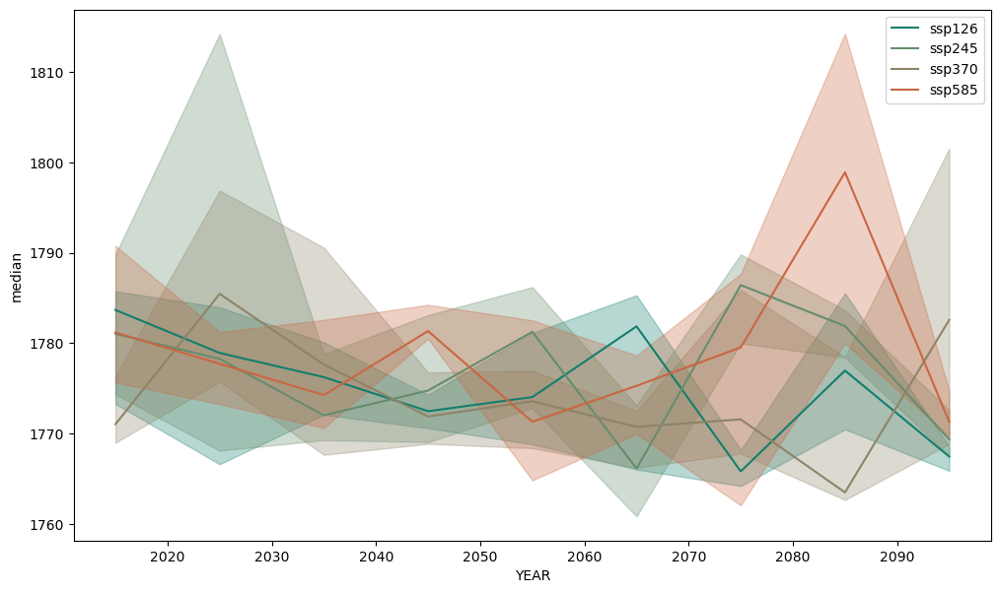

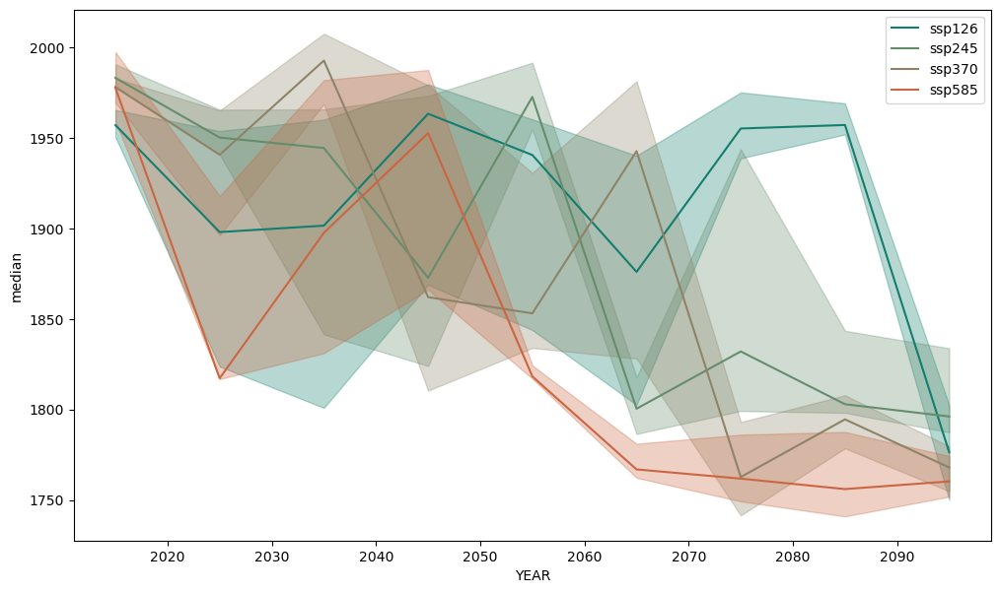

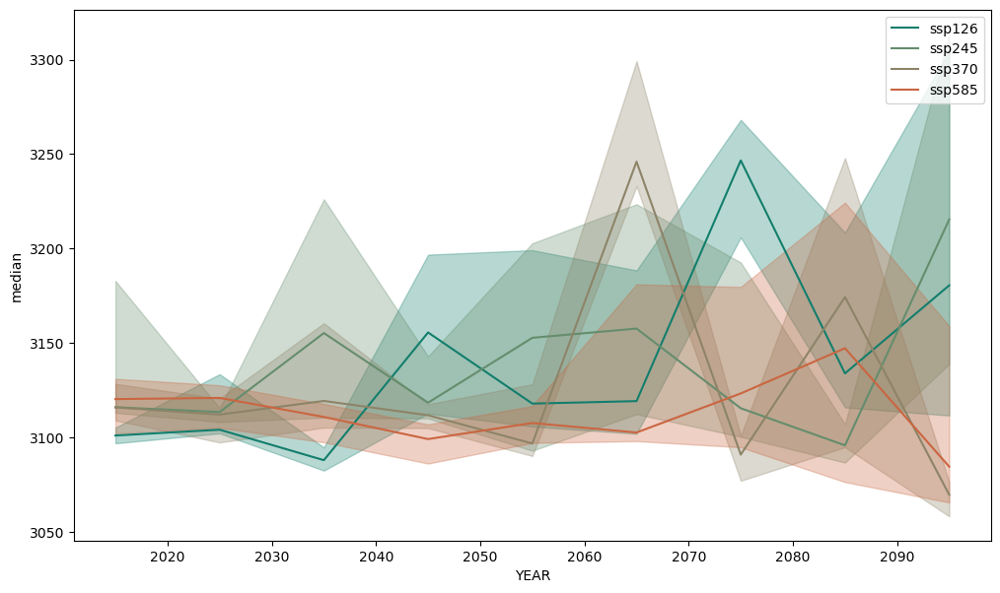

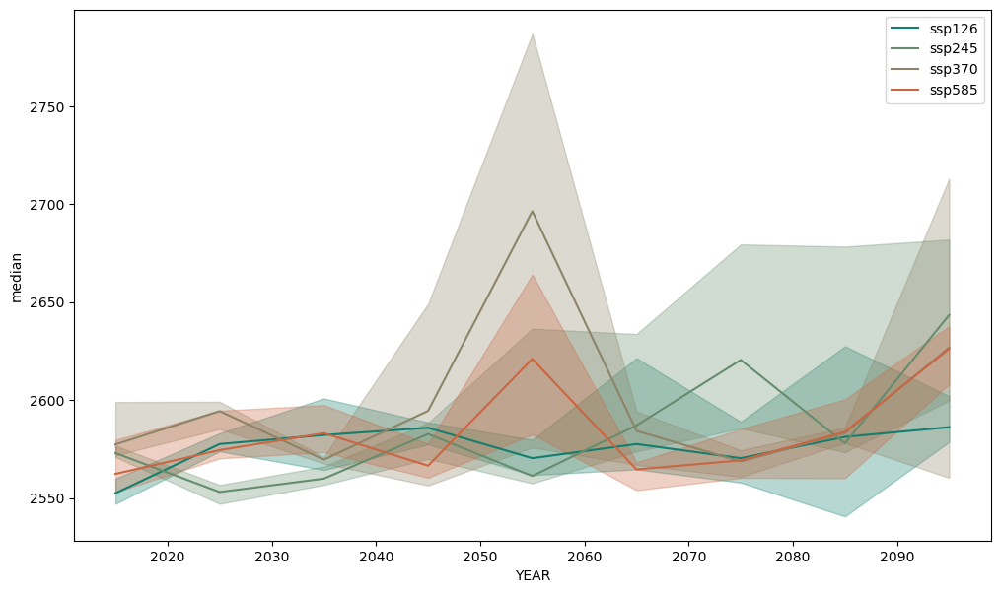

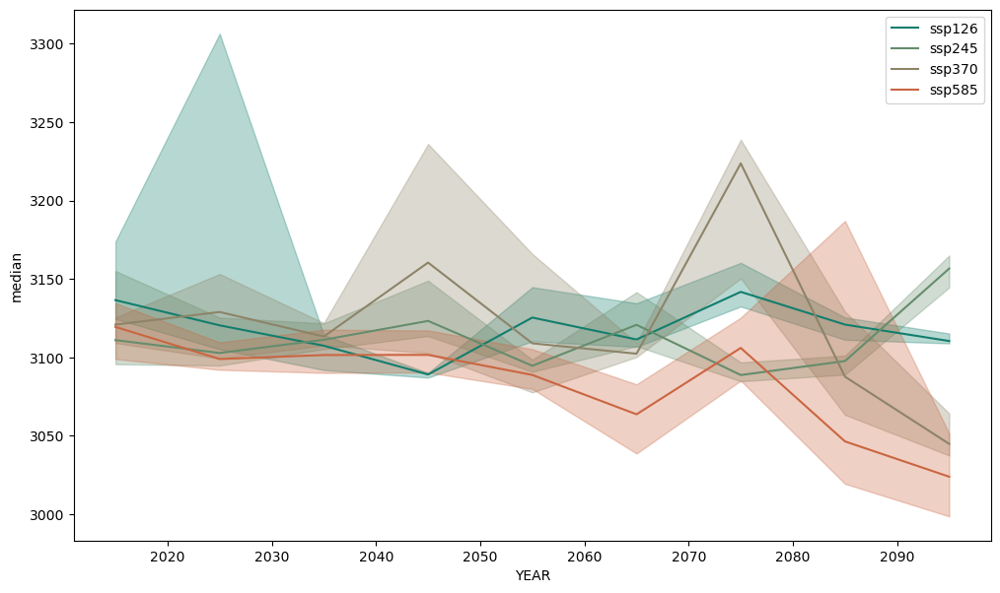

...

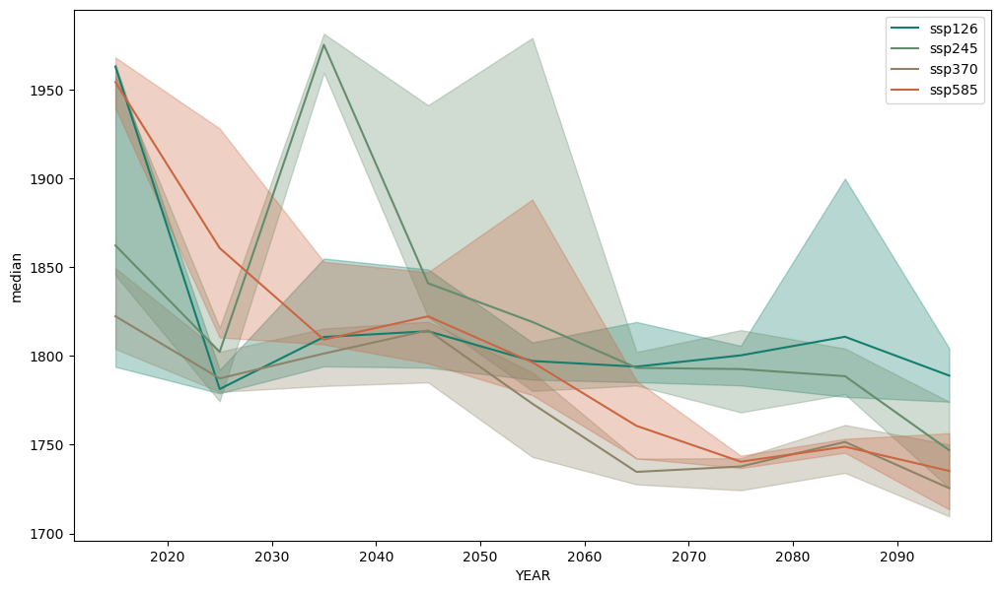

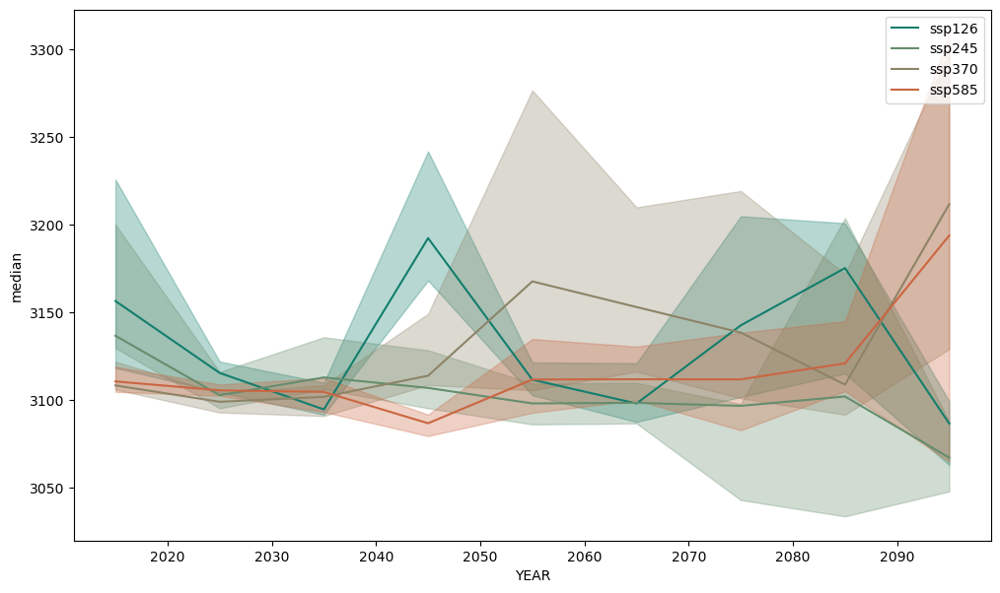

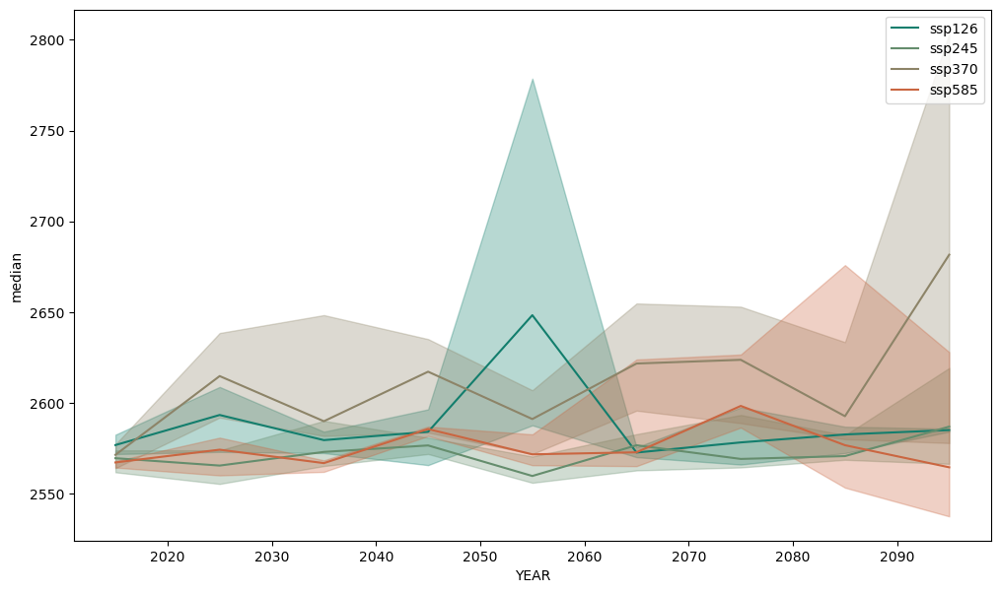

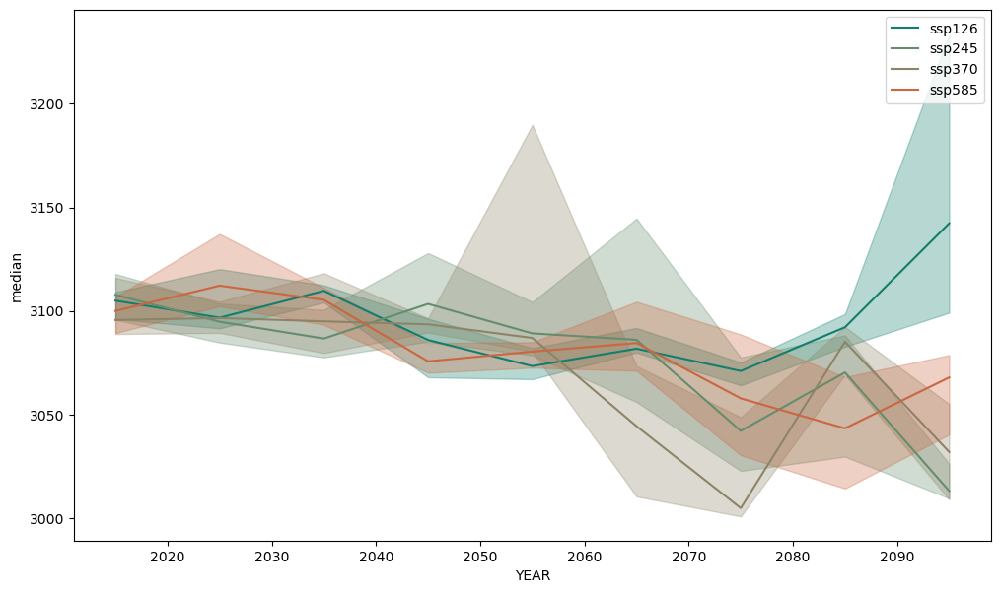

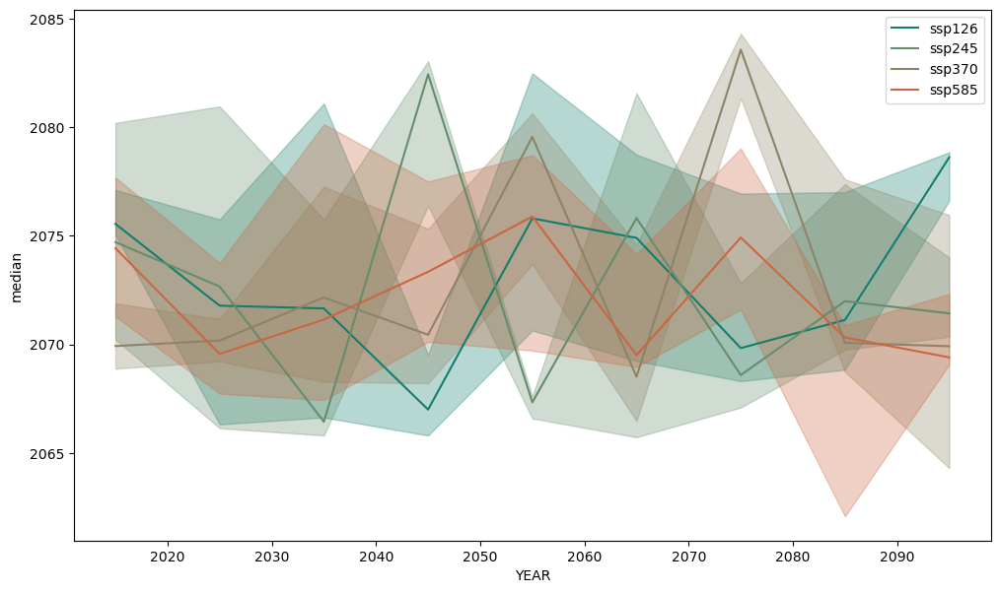

In [933]:
for thing in collection:
    thing.plot(smoothing=10)

## Run from disk CSV

In [244]:
collection=[]
models=[f.name for f in os.scandir('formatted_grid') if f.is_dir() and f.name != 'cpc.observed']

for model in models:
    for province in pcode_li:
        collection.append(runProvinceModel.from_csv(model, province))

In [245]:
for items in collection:
    print(items.model)

ACCESS-ESM1-5
ACCESS-ESM1-5
ACCESS-ESM1-5
ACCESS-ESM1-5
ACCESS-ESM1-5
ACCESS-ESM1-5
CNRM-CM6-1
CNRM-CM6-1
CNRM-CM6-1
CNRM-CM6-1
CNRM-CM6-1
CNRM-CM6-1
BCC-CSM2-MR
BCC-CSM2-MR
BCC-CSM2-MR
BCC-CSM2-MR
BCC-CSM2-MR
BCC-CSM2-MR
ACCESS-CM2
ACCESS-CM2
ACCESS-CM2
ACCESS-CM2
ACCESS-CM2
ACCESS-CM2
CanESM5
CanESM5
CanESM5
CanESM5
CanESM5
CanESM5
MIROC-ES2L
MIROC-ES2L
MIROC-ES2L
MIROC-ES2L
MIROC-ES2L
MIROC-ES2L
CNRM-ESM2-1
CNRM-ESM2-1
CNRM-ESM2-1
CNRM-ESM2-1
CNRM-ESM2-1
CNRM-ESM2-1
EC-Earth3
EC-Earth3
EC-Earth3
EC-Earth3
EC-Earth3
EC-Earth3
KIOST-ESM
KIOST-ESM
KIOST-ESM
KIOST-ESM
KIOST-ESM
KIOST-ESM
MIROC6
MIROC6
MIROC6
MIROC6
MIROC6
MIROC6
KACE-1-0-G
KACE-1-0-G
KACE-1-0-G
KACE-1-0-G
KACE-1-0-G
KACE-1-0-G
FGOALS-g3
FGOALS-g3
FGOALS-g3
FGOALS-g3
FGOALS-g3
FGOALS-g3
GISS-E2-1-G
GISS-E2-1-G
GISS-E2-1-G
GISS-E2-1-G
GISS-E2-1-G
GISS-E2-1-G
MRI-ESM2-0
MRI-ESM2-0
MRI-ESM2-0
MRI-ESM2-0
MRI-ESM2-0
MRI-ESM2-0
HadGEM3-GC31-LL
HadGEM3-GC31-LL
HadGEM3-GC31-LL
HadGEM3-GC31-LL
HadGEM3-GC31-LL
HadGEM3-GC31-LL
INM-

In [45]:
collection[0].ssp126

,YEAR,pred
0,2015,2945.369875
1,2016,2919.560575
2,2017,2878.225575
3,2018,2926.550950
4,2019,2940.043475
...,...,...
81,2096,2951.080175
82,2097,2869.622675
83,2098,2895.176650
84,2099,2927.546825


# Plot

## Ensemble Splitting

Split 24 use models into two ensembles.

Algorithm: 

for each province: sum all cells, average all years, compare models.

### Sort by Historical Performance

In [246]:
refyield=0
for pcode in pcode_li:
    econ=pd.read_csv(f"Observed_data/province/data.{pcode}.csv", na_values=['NONE'])
    print(econ.iloc[-21]['YEAR'], econ.iloc[-2]['YEAR'])
    
    refyield+=econ.iloc[-21:-1]['TGrainOut'].mean()

dummyyield=ready.iloc[-6:-1]['pred'].mean()

2001.0 2020.0
2001.0 2020.0
2001.0 2020.0
2001.0 2020.0
2001.0 2020.0
2001.0 2020.0


In [247]:
econ.iloc[-20:-1]['YEAR']

12    2002
13    2003
14    2004
15    2005
16    2006
17    2007
18    2008
19    2009
20    2010
21    2011
22    2012
23    2013
24    2014
25    2015
26    2016
27    2017
28    2018
29    2019
30    2020
Name: YEAR, dtype: int64

In [250]:
order=pd.read_csv('heatwave_order.csv', usecols=range(1,5))

In [251]:
def split(ssp, mode):
    pod=int(len(order[ssp].dropna())/2)
    if mode:
        return order[ssp].dropna()[pod:].reset_index(drop=True)
    else:
        return order[ssp].dropna()[:pod].reset_index(drop=True)

In [252]:
high=split('ssp126', 0)
low=split('ssp126', 1)

In [254]:
c1='#6f7f90'
c2='#307764'
c3='#8a7a6a'
c3e='tan'
c4='#994162'

In [128]:
c1='xkcd:blue green'
c2='xkcd:slate green'
c3='xkcd:puce'
c3e='tan'
c4='#c192aa'

for i in range(6):
    dfli126=[collection[i].ssp126]
    dfli245=[collection[i].ssp245]
    dfli370=[collection[i].ssp370]
    dfli585=[collection[i].ssp585]
    for j in range(24):

        if collection[i+6*j].model in high.values:
            
            if collection[i+6*j].ssp126 is not None: dfli126.append(collection[i+6*j].ssp126) 
            if collection[i+6*j].ssp245 is not None: dfli245.append(collection[i+6*j].ssp245)
            if collection[i+6*j].ssp370 is not None: dfli370.append(collection[i+6*j].ssp370) 
            if collection[i+6*j].ssp585 is not None: dfli585.append(collection[i+6*j].ssp585)
        
    n=6

    e1_p=smooth(dfli126, n)
    e2_p=smooth(dfli245, n)
    e3_p=smooth(dfli370, n)
    e5_p=smooth(dfli585, n)
    
    fig = plt.figure(figsize=(6,3))

    a=sns.lineplot(data=e1_p, x='YEAR', y='mean', label='ssp126', color=c1)
    b=sns.lineplot(data=e2_p, x='YEAR', y='mean', label='ssp245', color=c2)
    c=sns.lineplot(data=e3_p, x='YEAR', y='mean', label='ssp370', color=c3)
    d=sns.lineplot(data=e5_p, x='YEAR', y='mean', label='ssp585', color=c4)
    e=plt.fill_between(e1_p['YEAR'], e1_p['min'], e1_p['max'], alpha=0.3, color=c1)
    f=plt.fill_between(e2_p['YEAR'], e2_p['min'], e2_p['max'], alpha=0.3, color=c2)
    g=plt.fill_between(e3_p['YEAR'], e3_p['min'], e3_p['max'], alpha=0.3, color=c3e)
    h=plt.fill_between(e5_p['YEAR'], e5_p['min'], e5_p['max'], alpha=0.3, color=c4)

    fig.show()

AttributeError: 'runProvinceModel' object has no attribute 'ssp370'

In [ ]:
c1='xkcd:blue green'
c2='xkcd:slate green'
c3='xkcd:puce'
c3e='tan'
c4='xkcd:terracotta'

for i in range(6):
    dfli126=[collection[i].ssp126]
    dfli245=[collection[i].ssp245]
    dfli370=[collection[i].ssp370]
    dfli585=[collection[i].ssp585]
    for j in range(24):

        if collection[i+6*j].model in low.values:
        
            if collection[i+6*j].ssp126 is not None: dfli126.append(collection[i+6*j].ssp126) 
            if collection[i+6*j].ssp245 is not None: dfli245.append(collection[i+6*j].ssp245)
            if collection[i+6*j].ssp370 is not None: dfli370.append(collection[i+6*j].ssp370) 
            if collection[i+6*j].ssp585 is not None: dfli585.append(collection[i+6*j].ssp585)
    
    n=6

    e1_p=smooth(dfli126, n)
    e2_p=smooth(dfli245, n)
    e3_p=smooth(dfli370, n)
    e5_p=smooth(dfli585, n)
    
    fig = plt.figure(figsize=(6,4))

    a=sns.lineplot(data=e1_p, x='YEAR', y='mean', label='ssp126', color=c1)
    b=sns.lineplot(data=e2_p, x='YEAR', y='mean', label='ssp245', color=c2)
    c=sns.lineplot(data=e3_p, x='YEAR', y='mean', label='ssp370', color=c3)
    d=sns.lineplot(data=e5_p, x='YEAR', y='mean', label='ssp585', color=c4)
    e=plt.fill_between(e1_p['YEAR'], e1_p['min'], e1_p['max'], alpha=0.3, color=c1)
    f=plt.fill_between(e2_p['YEAR'], e2_p['min'], e2_p['max'], alpha=0.3, color=c2)
    g=plt.fill_between(e3_p['YEAR'], e3_p['min'], e3_p['max'], alpha=0.3, color=c3e)
    h=plt.fill_between(e5_p['YEAR'], e5_p['min'], e5_p['max'], alpha=0.3, color=c4)

    fig.show()

In [255]:
def smooth(dfli, n):
        adf=pd.concat([df['pred'] for df in dfli], axis=1)
        
        def calculate_stats(group):
            flattened_group = group.values.flatten()
            max_value = group.to_numpy().max()
            min_value = group.to_numpy().min()
            mean_value = group.median().median()#np.percentile(flattened_group, 50)
            percentile_25 = np.percentile(flattened_group, 25)
            percentile_75 = np.percentile(flattened_group, 75)
            return pd.Series({
                'median': mean_value,
                'max': percentile_75,
                'min': percentile_25,
            })

        # Group the DataFrame into chunks of 'n' and apply the calculate_stats function
        # Ensure the 'year' column is not included in the calculations
        grouped_df = adf.groupby(adf.index // n).apply(calculate_stats)
        grouped_df['YEAR'] = dfli[0]['YEAR'].groupby(adf.index // n).first()  # Retain the year information

        # Resetting index to have a clean DataFrame
        return grouped_df.reset_index(drop=True)

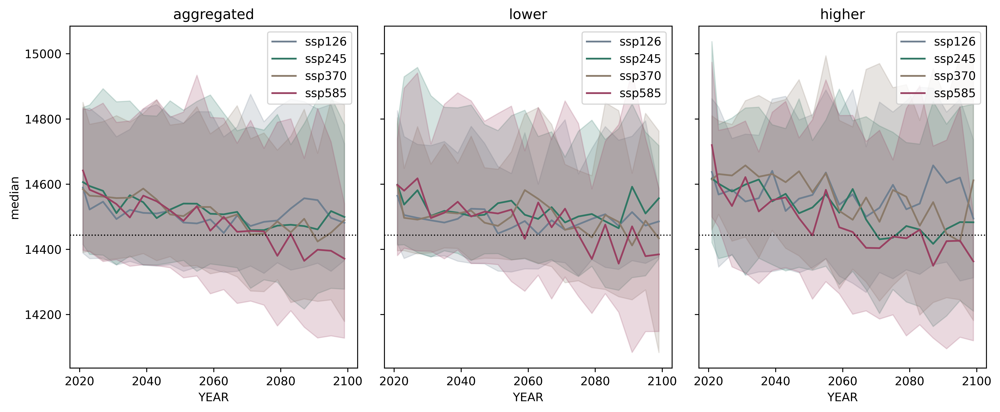

In [263]:
n=4
m=6

fig, axes = plt.subplots(1, 3, figsize=(12,5), dpi=600, sharey=True)

low=True


for i in range(6):

    dfli126=[]
    dfli245=[]
    dfli370=[]
    dfli585=[]
    
    for j in range(24):

        if collection[i+6*j].model in order['ssp126'].values:
            if collection[i+6*j].ssp126 is not None: dfli126.append(collection[i+6*j].ssp126.iloc[m:]) 
        if collection[i+6*j].model in order['ssp245'].values:
            if collection[i+6*j].ssp245 is not None: dfli245.append(collection[i+6*j].ssp245.iloc[m:])
        if collection[i+6*j].model in order['ssp370'].values:
            if collection[i+6*j].ssp370 is not None: dfli370.append(collection[i+6*j].ssp370.iloc[m:])
        if collection[i+6*j].model in order['ssp585'].values:
            if collection[i+6*j].ssp585 is not None: dfli585.append(collection[i+6*j].ssp585.iloc[m:])

    if i==0:
        e1_p=smooth(dfli126, n)
        e2_p=smooth(dfli245, n)
        e3_p=smooth(dfli370, n)
        e5_p=smooth(dfli585, n)

        year_state=e1_p

        e1_p.drop(['YEAR'], axis=1)
        e2_p.drop(['YEAR'], axis=1)
        e3_p.drop(['YEAR'], axis=1)
        e5_p.drop(['YEAR'], axis=1)

    else:
        e1_p=e1_p+smooth(dfli126, n).drop(['YEAR'], axis=1)
        e2_p=e2_p+smooth(dfli245, n).drop(['YEAR'], axis=1)
        e3_p=e3_p+smooth(dfli370, n).drop(['YEAR'], axis=1)
        e5_p=e5_p+smooth(dfli585, n).drop(['YEAR'], axis=1)

a=sns.lineplot(data=e1_p, x=year_state['YEAR'], y='median', label='ssp126', color=c1, ax=axes[0])
b=sns.lineplot(data=e2_p, x=year_state['YEAR'], y='median', label='ssp245', color=c2, ax=axes[0])
c=sns.lineplot(data=e3_p, x=year_state['YEAR'], y='median', label='ssp370', color=c3, ax=axes[0])
d=sns.lineplot(data=e5_p, x=year_state['YEAR'], y='median', label='ssp585', color=c4, ax=axes[0])
e=axes[0].fill_between(year_state['YEAR'], e1_p['min'], e1_p['max'], alpha=0.2, color=c1)
f=axes[0].fill_between(year_state['YEAR'], e2_p['min'], e2_p['max'], alpha=0.2, color=c2)
g=axes[0].fill_between(year_state['YEAR'], e3_p['min'], e3_p['max'], alpha=0.2, color=c3)
h=axes[0].fill_between(year_state['YEAR'], e5_p['min'], e5_p['max'], alpha=0.2, color=c4)

axes[0].axhline(y=refyield, color='black', linestyle=':', linewidth=1)

low=True

for i in range(6):

    dfli126=[]
    dfli245=[]
    dfli370=[]
    dfli585=[]
    
    for j in range(24):

        if collection[i+6*j].model in split('ssp126', low).values:
            if collection[i+6*j].ssp126 is not None: dfli126.append(collection[i+6*j].ssp126.iloc[m:]) 
        if collection[i+6*j].model in split('ssp245', low).values:                
            if collection[i+6*j].ssp245 is not None: dfli245.append(collection[i+6*j].ssp245.iloc[m:])
        if collection[i+6*j].model in split('ssp370', low).values:            
            if collection[i+6*j].ssp370 is not None: dfli370.append(collection[i+6*j].ssp370.iloc[m:]) 
        if collection[i+6*j].model in split('ssp585', low).values:
            if collection[i+6*j].ssp585 is not None: dfli585.append(collection[i+6*j].ssp585.iloc[m:])

    if i==0:
        e1_p=smooth(dfli126, n)
        e2_p=smooth(dfli245, n)
        e3_p=smooth(dfli370, n)
        e5_p=smooth(dfli585, n)

        year_state=e1_p

        e1_p.drop(['YEAR'], axis=1)
        e2_p.drop(['YEAR'], axis=1)
        e3_p.drop(['YEAR'], axis=1)
        e5_p.drop(['YEAR'], axis=1)

    else:
        e1_p=e1_p+smooth(dfli126, n).drop(['YEAR'], axis=1)
        e2_p=e2_p+smooth(dfli245, n).drop(['YEAR'], axis=1)
        e3_p=e3_p+smooth(dfli370, n).drop(['YEAR'], axis=1)
        e5_p=e5_p+smooth(dfli585, n).drop(['YEAR'], axis=1)

a=sns.lineplot(data=e1_p, x=year_state['YEAR'], y='median', label='ssp126', color=c1, ax=axes[1])
b=sns.lineplot(data=e2_p, x=year_state['YEAR'], y='median', label='ssp245', color=c2, ax=axes[1])
c=sns.lineplot(data=e3_p, x=year_state['YEAR'], y='median', label='ssp370', color=c3, ax=axes[1])
d=sns.lineplot(data=e5_p, x=year_state['YEAR'], y='median', label='ssp585', color=c4, ax=axes[1])
e=axes[1].fill_between(year_state['YEAR'], e1_p['min'], e1_p['max'], alpha=0.2, color=c1)
f=axes[1].fill_between(year_state['YEAR'], e2_p['min'], e2_p['max'], alpha=0.2, color=c2)
g=axes[1].fill_between(year_state['YEAR'], e3_p['min'], e3_p['max'], alpha=0.2, color=c3)
h=axes[1].fill_between(year_state['YEAR'], e5_p['min'], e5_p['max'], alpha=0.2, color=c4)

low=False

for i in range(6):
    dfli126=[]
    dfli245=[]
    dfli370=[]
    dfli585=[]
    
    for j in range(24):

        if collection[i+6*j].model in split('ssp126', low).values:
            if collection[i+6*j].ssp126 is not None: dfli126.append(collection[i+6*j].ssp126.iloc[m:]) 
        if collection[i+6*j].model in split('ssp245', low).values:                
            if collection[i+6*j].ssp245 is not None: dfli245.append(collection[i+6*j].ssp245.iloc[m:])
        if collection[i+6*j].model in split('ssp370', low).values:            
            if collection[i+6*j].ssp370 is not None: dfli370.append(collection[i+6*j].ssp370.iloc[m:]) 
        if collection[i+6*j].model in split('ssp585', low).values:
            if collection[i+6*j].ssp585 is not None: dfli585.append(collection[i+6*j].ssp585.iloc[m:])

    if i==0:
        e1_p=smooth(dfli126, n)
        e2_p=smooth(dfli245, n)
        e3_p=smooth(dfli370, n)
        e5_p=smooth(dfli585, n)

        year_state=e1_p

        e1_p.drop(['YEAR'], axis=1)
        e2_p.drop(['YEAR'], axis=1)
        e3_p.drop(['YEAR'], axis=1)
        e5_p.drop(['YEAR'], axis=1)

    else:
        e1_p=e1_p+smooth(dfli126, n).drop(['YEAR'], axis=1)
        e2_p=e2_p+smooth(dfli245, n).drop(['YEAR'], axis=1)
        e3_p=e3_p+smooth(dfli370, n).drop(['YEAR'], axis=1)
        e5_p=e5_p+smooth(dfli585, n).drop(['YEAR'], axis=1)

a=sns.lineplot(data=e1_p, x=year_state['YEAR'], y='median', label='ssp126', color=c1, ax=axes[2])
b=sns.lineplot(data=e2_p, x=year_state['YEAR'], y='median', label='ssp245', color=c2, ax=axes[2])
c=sns.lineplot(data=e3_p, x=year_state['YEAR'], y='median', label='ssp370', color=c3, ax=axes[2])
d=sns.lineplot(data=e5_p, x=year_state['YEAR'], y='median', label='ssp585', color=c4, ax=axes[2])
e=axes[2].fill_between(year_state['YEAR'], e1_p['min'], e1_p['max'], alpha=0.2, color=c1)
f=axes[2].fill_between(year_state['YEAR'], e2_p['min'], e2_p['max'], alpha=0.2, color=c2)
g=axes[2].fill_between(year_state['YEAR'], e3_p['min'], e3_p['max'], alpha=0.2, color=c3)
h=axes[2].fill_between(year_state['YEAR'], e5_p['min'], e5_p['max'], alpha=0.2, color=c4)
#obs=axes[1].scatter(ready['YEAR'],ready['TGrainOut'],c=Ctr)
#pred=axes[1].plot(ready['YEAR'],ready['pred'], alpha=0.8, c=Cln_light, linewidth=2)

axes[0].axhline(y=refyield, color='black', linestyle=':', linewidth=1)
axes[1].axhline(y=refyield, color='black', linestyle=':', linewidth=1)
axes[2].axhline(y=refyield, color='black', linestyle=':', linewidth=1)

axes[0].set_title('aggregated')
axes[1].set_title('lower')
axes[2].set_title('higher')

fig.tight_layout()

In [192]:
werio=pd.DataFrame(index=range(13))

werio['126high']=split('ssp126', False)
werio['126low']=split('ssp126', True)
werio['245high']=split('ssp245', False)
werio['245low']=split('ssp245', True)
werio['370high']=split('ssp370', False)
werio['370low']=split('ssp370', True)
werio['585high']=split('ssp585', False)
werio['585low']=split('ssp585', True)

There are 23 avail ds.
There are 23 avail ds.
There are 24 avail ds.
There are 24 avail ds.
There are 19 avail ds.
There are 19 avail ds.
There are 20 avail ds.
There are 20 avail ds.
